###0. Import libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import altair as alt
import tensorflow as tf

sns.set(rc={'figure.figsize':(10,10)})
print("imports ok")

imports ok


In [2]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###1. Import cleaned data

In [6]:
# Load csv
dataMod = pd.read_csv('/content/drive/MyDrive/0.Thesis/binnedData_BA.csv')

In [7]:
dataMod

,myIndex,roomNumber,FloorHeight,Width,Length,Rotation,SouthContextOffset,EastContextOffset,NorthContextOffset,WestContextOffset,...,EastWindowSill,sDA,UDI,ASE,sDABin,UDIBin,ASEBin,sDA_Category,UDI_Category,ASE_Category
0,0,0.0,4.0,5.666667,27.333333,-41.0,39.0,41.0,23.0,73.0,...,2.0,100.00,46.752525,78.62,"(91.47, 100.0]","(40.288, 64.719]","(41.09, 100.0]",4,2,4
1,1,0.0,4.0,5.666667,27.333333,-41.0,39.0,41.0,23.0,73.0,...,2.0,100.00,62.612795,49.66,"(91.47, 100.0]","(40.288, 64.719]","(41.09, 100.0]",4,2,4
2,2,0.0,4.0,5.666667,27.333333,-41.0,39.0,41.0,23.0,73.0,...,2.0,100.00,49.333333,50.84,"(91.47, 100.0]","(40.288, 64.719]","(41.09, 100.0]",4,2,4
3,3,0.0,4.0,5.666667,27.333333,-41.0,39.0,41.0,23.0,73.0,...,2.0,24.58,29.116162,13.30,"(16.03, 52.94]","(-0.001, 40.288]","(3.74, 16.56]",2,1,2
4,5,0.0,4.0,5.666667,27.333333,-41.0,39.0,41.0,23.0,73.0,...,2.0,29.46,40.277778,0.00,"(16.03, 52.94]","(-0.001, 40.288]","(-0.001, 3.74]",2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14179,15951,1999.0,8.0,8.000000,9.000000,-16.0,25.0,25.0,74.0,20.0,...,4.0,74.31,73.482639,39.24,"(52.94, 91.47]","(64.719, 78.711]","(16.56, 41.09]",3,3,3
14180,15953,1999.0,8.0,8.000000,9.000000,-16.0,25.0,25.0,74.0,20.0,...,4.0,84.72,96.218750,0.00,"(52.94, 91.47]","(87.267, 96.724]","(-0.001, 3.74]",3,5,1
14181,15954,1999.0,8.0,8.000000,9.000000,-16.0,25.0,25.0,74.0,20.0,...,4.0,100.00,54.861111,84.72,"(91.47, 100.0]","(40.288, 64.719]","(41.09, 100.0]",4,2,4
14182,15955,1999.0,8.0,8.000000,9.000000,-16.0,25.0,25.0,74.0,20.0,...,4.0,98.96,89.940972,39.24,"(91.47, 100.0]","(87.267, 96.724]","(16.56, 41.09]",4,5,3


In [8]:
dataMod = dataMod.drop(columns = ['roomNumber', 'myIndex'])

##2. Plot Data

###PCA Analysis

In [9]:
import pandas as pd #Pandas handles tabular data
pd.set_option('display.float_format', lambda x: '%.3f' % x) # turn off scientific notation and too much decimal blah
import matplotlib.pyplot as plt # standard plotting library
import numpy as np #Numpy for linear algebra & co
import seaborn as sns # For pretty dataviz
sns.set_style("darkgrid") # Define style for dataviz

In [ ]:
#Plot sDA pairplot
data_numerical = dataMod[["FloorHeight", "Width", "Length", "Rotation", 'SouthContextOffset', 'EastContextOffset', 'NorthContextOffset', 'WestContextOffset', 'SouthContextHeight', 'EastContextHeight', 'NorthContextHeight' , 
                          'WestContextHeight' , 'SouthShadingDepth' , 'EastShadingDepth' , 'NorthShadingDepth' , 'WestShadingDepth' , 'NorthGlazingRatio' , 'WestGlazingRatio' , 'SouthGlazingRatio' , 'EastGlazingRatio' , 
                          'NorthWindowHeight' , 'WestWindowHeight' , 'SouthWindowHeight' , 'EastWindowHeight' , 'NorthWindowSill' , 'WestWindowSill' , 'SouthWindowSill' , 'EastWindowSill', 'sDABin' ]]
sns.pairplot(data_numerical, hue = 'sDABin')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#Plot UDI pairplot
data_numerical = dataMod[["FloorHeight", "Width", "Length", "Rotation", 'SouthContextOffset', 'EastContextOffset', 'NorthContextOffset', 'WestContextOffset', 'SouthContextHeight', 'EastContextHeight', 'NorthContextHeight' , 
                          'WestContextHeight' , 'SouthShadingDepth' , 'EastShadingDepth' , 'NorthShadingDepth' , 'WestShadingDepth' , 'NorthGlazingRatio' , 'WestGlazingRatio' , 'SouthGlazingRatio' , 'EastGlazingRatio' , 
                          'NorthWindowHeight' , 'WestWindowHeight' , 'SouthWindowHeight' , 'EastWindowHeight' , 'NorthWindowSill' , 'WestWindowSill' , 'SouthWindowSill' , 'EastWindowSill' , 'UDIBin']]
sns.pairplot(data_numerical, hue = 'UDIBin')

Output hidden; open in https://colab.research.google.com to view.

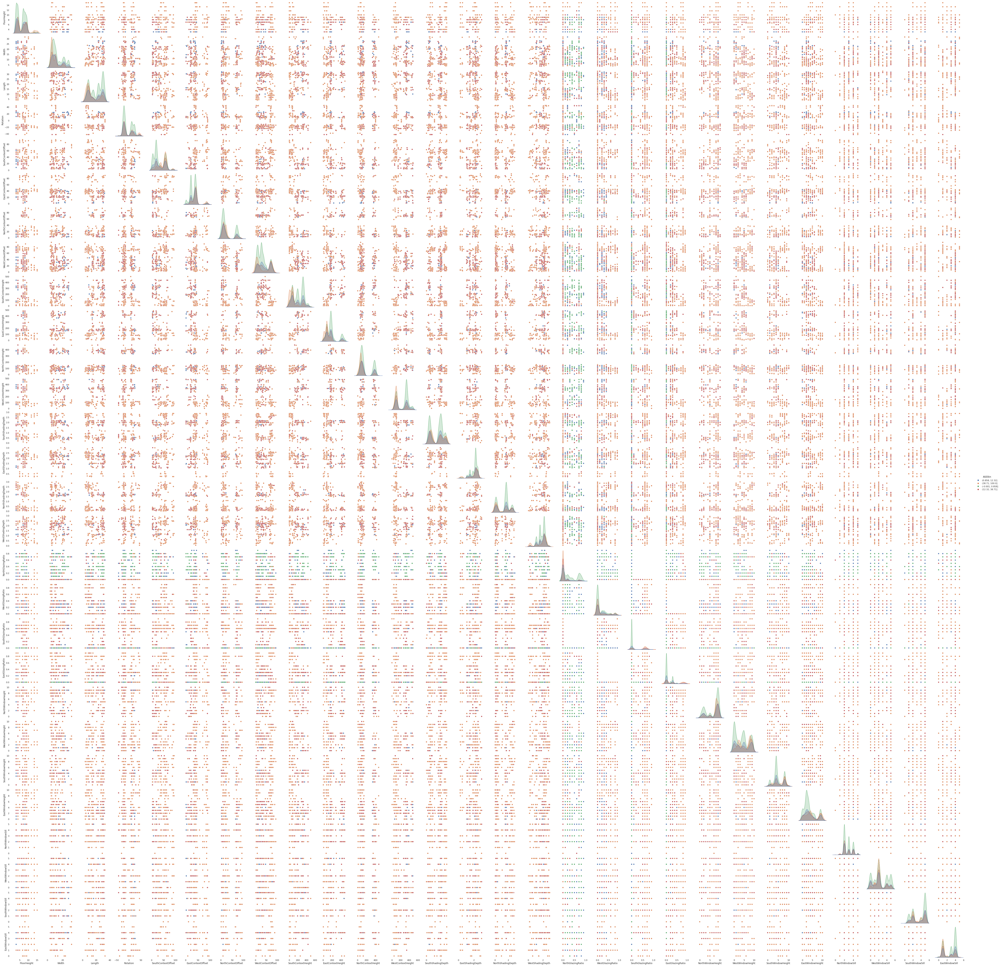

In [ ]:
#Plot ASE pairplot
data_numerical = dataMod[["FloorHeight", "Width", "Length", "Rotation", 'SouthContextOffset', 'EastContextOffset', 'NorthContextOffset', 'WestContextOffset', 'SouthContextHeight', 'EastContextHeight', 'NorthContextHeight' , 
                          'WestContextHeight' , 'SouthShadingDepth' , 'EastShadingDepth' , 'NorthShadingDepth' , 'WestShadingDepth' , 'NorthGlazingRatio' , 'WestGlazingRatio' , 'SouthGlazingRatio' , 'EastGlazingRatio' , 
                          'NorthWindowHeight' , 'WestWindowHeight' , 'SouthWindowHeight' , 'EastWindowHeight' , 'NorthWindowSill' , 'WestWindowSill' , 'SouthWindowSill' , 'EastWindowSill' ,'ASEBin']]
sns.pairplot(data_numerical, hue = 'ASEBin')

In [10]:
#change plot size
sns.set(rc={'figure.figsize':(20,15)})

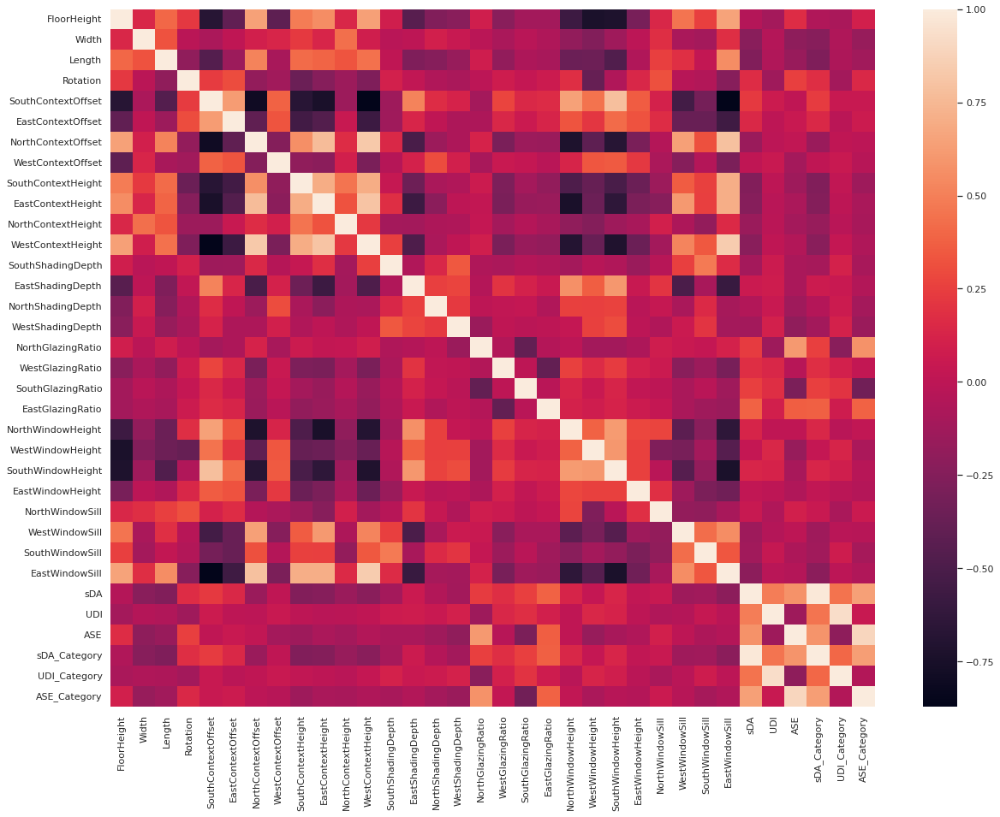

In [11]:
# And lastly, a correlation plot
fig = sns.heatmap(dataMod.corr())

### Preprocessing

In [12]:
# Transfer the (categorical) outcome of interest to the index (PCA only works with numerical data)
data_num = dataMod.drop(columns = ['sDA', 'sDABin',  'sDA_Category','UDI','UDIBin',  'UDI_Category', 'ASE', 'ASEBin', 'ASE_Category'])

In [13]:
from sklearn.preprocessing import StandardScaler

In [14]:
# Let's standard-scale our data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_num)

In [15]:
# What are mean and Sd now?
pd.DataFrame(data_scaled, columns=data_num.columns).describe()

,FloorHeight,Width,Length,Rotation,SouthContextOffset,EastContextOffset,NorthContextOffset,WestContextOffset,SouthContextHeight,EastContextHeight,...,SouthGlazingRatio,EastGlazingRatio,NorthWindowHeight,WestWindowHeight,SouthWindowHeight,EastWindowHeight,NorthWindowSill,WestWindowSill,SouthWindowSill,EastWindowSill
count,14184.000,14184.000,14184.000,14184.000,14184.000,14184.000,14184.000,14184.000,14184.000,14184.000,...,14184.000,14184.000,14184.000,14184.000,14184.000,14184.000,14184.000,14184.000,14184.000,14184.000
mean,0.000,0.000,0.000,0.000,0.000,-0.000,0.000,-0.000,0.000,0.000,...,0.000,0.000,-0.000,0.000,0.000,-0.000,-0.000,0.000,0.000,0.000
std,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
min,-1.541,-1.344,-1.324,-1.529,-1.292,-2.171,-1.448,-1.241,-1.414,-1.303,...,-0.700,-0.647,-1.903,-2.418,-1.611,-1.314,-2.016,-1.813,-3.116,-1.756
25%,-1.089,-0.756,-0.771,-0.467,-1.167,-0.614,-1.051,-0.817,-0.735,-0.817,...,-0.700,-0.647,-1.266,-0.682,-0.916,-0.662,-0.331,-0.609,-1.574,-1.086
50%,0.268,-0.240,-0.438,-0.226,-0.077,0.063,-0.654,-0.239,0.093,-0.331,...,-0.700,-0.647,0.647,-0.248,-0.221,-0.336,-0.331,-0.609,0.739,0.926
75%,0.721,0.275,1.112,-0.177,0.971,0.469,1.005,1.148,0.713,1.211,...,1.156,0.408,0.966,1.055,1.168,0.642,1.355,1.198,0.739,0.926
max,1.625,4.838,1.923,2.767,2.479,4.057,1.871,2.304,3.548,1.795,...,2.640,2.518,1.284,1.923,1.863,1.945,2.197,1.198,0.739,1.596


### Executing PCA

In [16]:
# Instantiate a PCA object for sDA
from sklearn.decomposition import PCA # PCA from  sklearn, the python ML standard library
modelsDA = PCA() # Number of components needs to be defined. We just for illustration take about half of the numbers of features

In [17]:
# Fit the model for UDI
modelsDA.fit(data_scaled)

PCA()

In [18]:
# Fit and transform the data for sDA
data_reduced_sDA = modelsDA.transform(data_scaled)
data_num_reduced_df_sDA = pd.DataFrame(data_reduced_sDA)
data_num_reduced_df_sDA["sDA"] = dataMod["sDA"]

print(data_num_reduced_df_sDA)

           0      1      2     3      4      5      6      7      8      9  \
0      1.769  2.782  0.761 3.375 -2.474  0.165  2.799  1.606  1.689  1.180   
1      1.881  2.545  0.874 3.360 -1.339 -1.301  2.335  1.890  1.416  0.801   
2      2.007  2.500  0.869 3.309 -0.734 -2.475  1.559  2.093  2.115  1.102   
3      1.428  2.730  0.868 3.483 -1.089  1.415  1.991  1.501  2.184  1.269   
4      1.666  2.448  0.976 3.418  0.652 -1.225  0.751  1.987  2.610  1.191   
...      ...    ...    ...   ...    ...    ...    ...    ...    ...    ...   
14179 -3.566 -0.750 -0.767 1.426  0.293 -0.076  1.162 -0.913 -0.324 -0.835   
14180 -3.451 -0.847 -0.738 1.388  1.021 -1.278  0.513 -0.697  0.064 -0.743   
14181 -3.466 -0.654 -0.910 1.688  1.077  0.731  0.582 -0.904 -0.442 -0.892   
14182 -3.434 -0.722 -0.878 1.684  1.401  0.312  0.449 -0.823 -0.520 -1.001   
14183 -3.351 -0.752 -0.881 1.650  1.805 -0.470 -0.068 -0.688 -0.054 -0.800   

       ...     19     20     21     22     23     24     25    

In [19]:
# Instantiate a PCA object for UDI
from sklearn.decomposition import PCA # PCA from  sklearn, the python ML standard library
modelUDI = PCA() # Number of components needs to be defined. We just for illustration take about half of the numbers of features

In [20]:
# Fit the model for UDI
modelUDI.fit(data_scaled)

PCA()

In [21]:
# Fit and transform the data for UDI
data_reduced_UDI = modelUDI.transform(data_scaled)
data_num_reduced_df_UDI = pd.DataFrame(data_reduced_UDI)
data_num_reduced_df_UDI["UDI"] = dataMod["UDI"]

print(data_num_reduced_df_UDI)

           0      1      2     3      4      5      6      7      8      9  \
0      1.769  2.782  0.761 3.375 -2.474  0.165  2.799  1.606  1.689  1.180   
1      1.881  2.545  0.874 3.360 -1.339 -1.301  2.335  1.890  1.416  0.801   
2      2.007  2.500  0.869 3.309 -0.734 -2.475  1.559  2.093  2.115  1.102   
3      1.428  2.730  0.868 3.483 -1.089  1.415  1.991  1.501  2.184  1.269   
4      1.666  2.448  0.976 3.418  0.652 -1.225  0.751  1.987  2.610  1.191   
...      ...    ...    ...   ...    ...    ...    ...    ...    ...    ...   
14179 -3.566 -0.750 -0.767 1.426  0.293 -0.076  1.162 -0.913 -0.324 -0.835   
14180 -3.451 -0.847 -0.738 1.388  1.021 -1.278  0.513 -0.697  0.064 -0.743   
14181 -3.466 -0.654 -0.910 1.688  1.077  0.731  0.582 -0.904 -0.442 -0.892   
14182 -3.434 -0.722 -0.878 1.684  1.401  0.312  0.449 -0.823 -0.520 -1.001   
14183 -3.351 -0.752 -0.881 1.650  1.805 -0.470 -0.068 -0.688 -0.054 -0.800   

       ...     19     20     21     22     23     24     25    

In [22]:
# Instantiate a PCA object for ASE
from sklearn.decomposition import PCA # PCA from  sklearn, the python ML standard library
modelASE = PCA() # Number of components needs to be defined. We just for illustration take about half of the numbers of features

In [23]:
# Fit the model for ASE
modelASE.fit(data_scaled)

PCA()

In [24]:
# Fit and transform the data for ASE
data_reduced_ASE = modelASE.transform(data_scaled)
data_num_reduced_df_ASE = pd.DataFrame(data_reduced_ASE)
data_num_reduced_df_ASE["ASE"] = dataMod["ASE"]

print(data_num_reduced_df_ASE)

           0      1      2     3      4      5      6      7      8      9  \
0      1.769  2.782  0.761 3.375 -2.474  0.165  2.799  1.606  1.689  1.180   
1      1.881  2.545  0.874 3.360 -1.339 -1.301  2.335  1.890  1.416  0.801   
2      2.007  2.500  0.869 3.309 -0.734 -2.475  1.559  2.093  2.115  1.102   
3      1.428  2.730  0.868 3.483 -1.089  1.415  1.991  1.501  2.184  1.269   
4      1.666  2.448  0.976 3.418  0.652 -1.225  0.751  1.987  2.610  1.191   
...      ...    ...    ...   ...    ...    ...    ...    ...    ...    ...   
14179 -3.566 -0.750 -0.767 1.426  0.293 -0.076  1.162 -0.913 -0.324 -0.835   
14180 -3.451 -0.847 -0.738 1.388  1.021 -1.278  0.513 -0.697  0.064 -0.743   
14181 -3.466 -0.654 -0.910 1.688  1.077  0.731  0.582 -0.904 -0.442 -0.892   
14182 -3.434 -0.722 -0.878 1.684  1.401  0.312  0.449 -0.823 -0.520 -1.001   
14183 -3.351 -0.752 -0.881 1.650  1.805 -0.470 -0.068 -0.688 -0.054 -0.800   

       ...     19     20     21     22     23     24     25    

### Inspecting Results

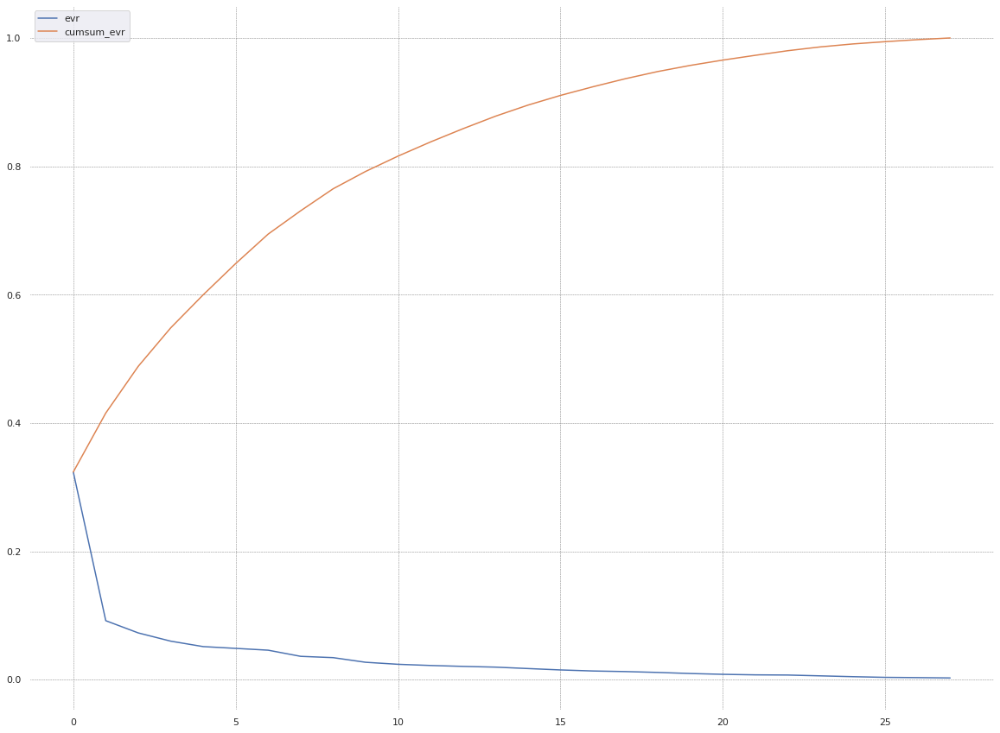

In [25]:
#sDA
plt.rcParams['axes.facecolor'] = 'white' # makes background white 
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5) #change grid line appearance
plot_data = pd.DataFrame({'evr': modelsDA.explained_variance_ratio_, 'cumsum_evr': np.cumsum(modelsDA.explained_variance_ratio_)}).stack()
sns.set(rc={'figure.figsize':(20,20)})
sns.lineplot(y = plot_data.values, x = plot_data.index.get_level_values(0), hue=plot_data.index.get_level_values(1))

In [26]:
#sDA
print(modelsDA.explained_variance_ratio_)
print()

[0.32359019 0.09186809 0.07282096 0.05995978 0.05148548 0.0487126
 0.04589264 0.03631519 0.03427441 0.0270539  0.02390884 0.02205659
 0.02065056 0.01948423 0.01727345 0.0151125  0.0134744  0.01256291
 0.01121132 0.0095349  0.00827729 0.00744638 0.00716684 0.00590954
 0.00462589 0.00355258 0.00315292 0.00262562]



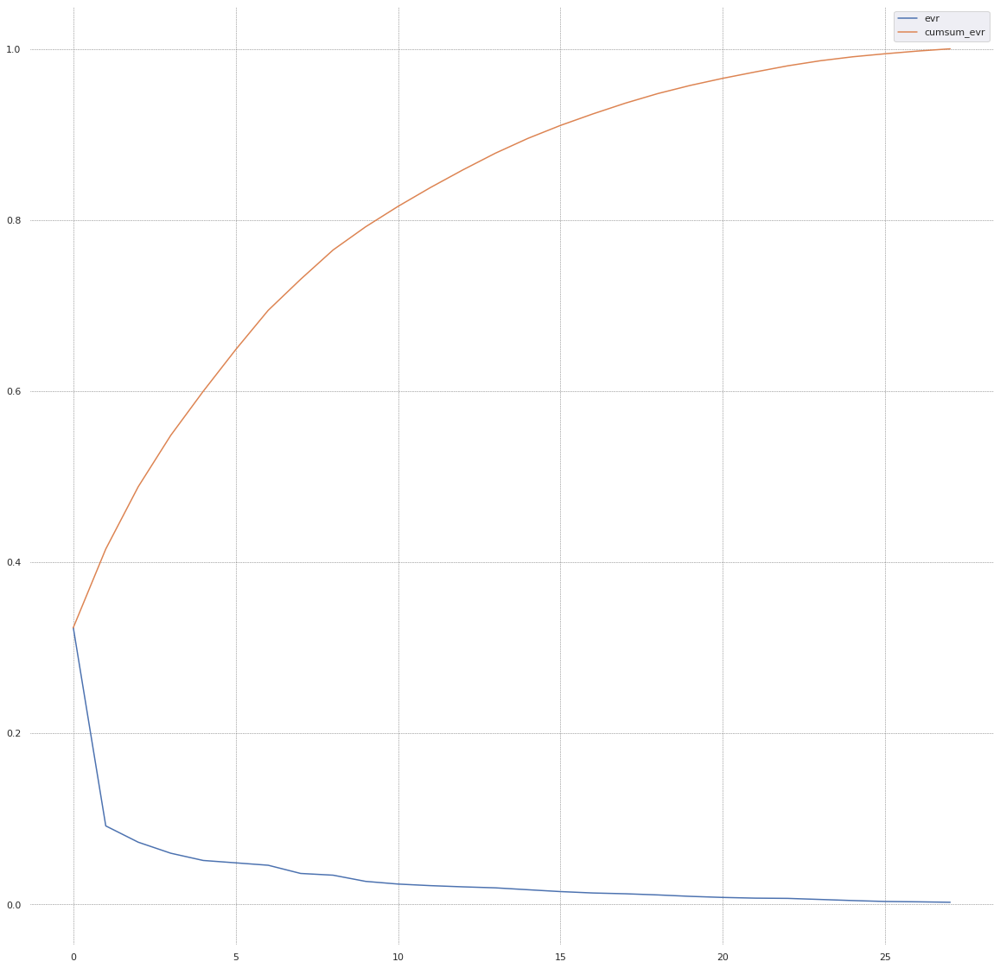

In [27]:
#UDI
plt.rcParams['axes.facecolor'] = 'white' # makes background white 
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5) #change grid line appearance
plot_data = pd.DataFrame({'evr': modelUDI.explained_variance_ratio_, 'cumsum_evr': np.cumsum(modelUDI.explained_variance_ratio_)}).stack()
sns.set(rc={'figure.figsize':(20,20)})
sns.lineplot(y = plot_data.values, x = plot_data.index.get_level_values(0), hue=plot_data.index.get_level_values(1))

In [28]:
#UDI
print(modelUDI.explained_variance_ratio_)
print()

[0.32359019 0.09186809 0.07282096 0.05995978 0.05148548 0.0487126
 0.04589264 0.03631519 0.03427441 0.0270539  0.02390884 0.02205659
 0.02065056 0.01948423 0.01727345 0.0151125  0.0134744  0.01256291
 0.01121132 0.0095349  0.00827729 0.00744638 0.00716684 0.00590954
 0.00462589 0.00355258 0.00315292 0.00262562]



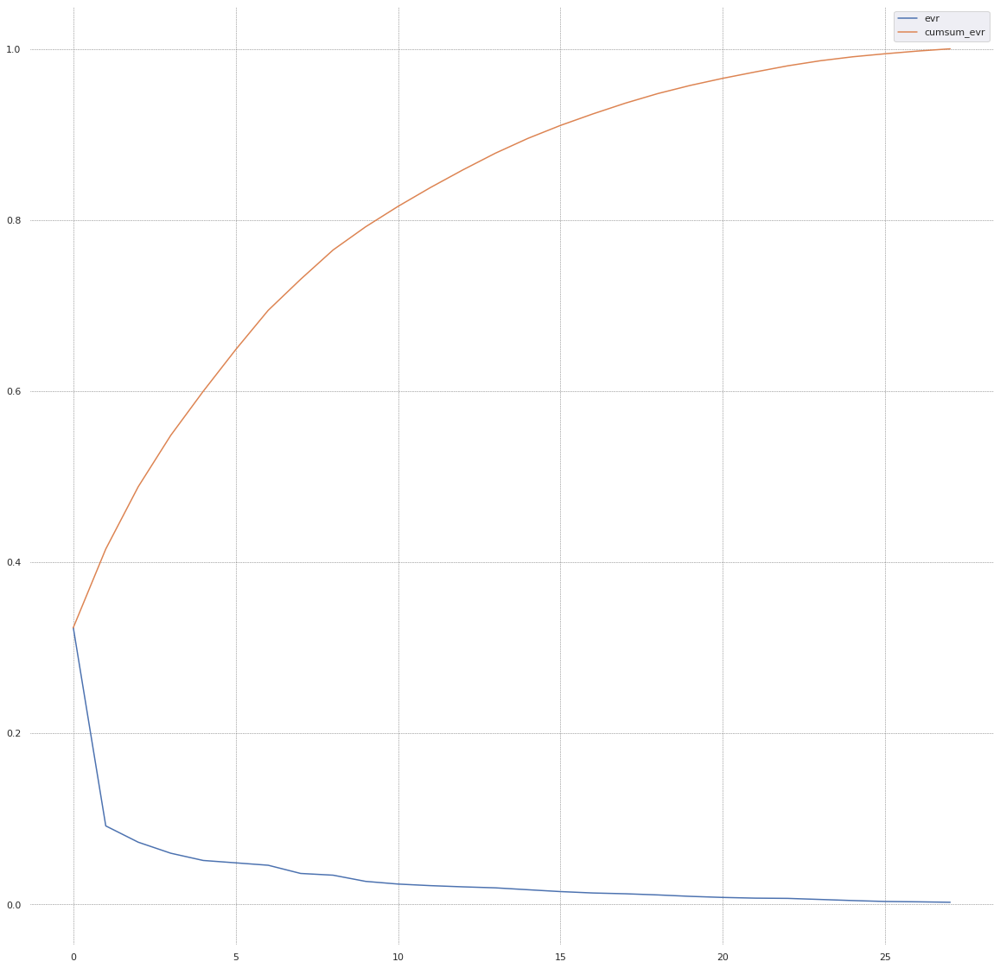

In [29]:
#ASE
plt.rcParams['axes.facecolor'] = 'white' # makes background white 
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5) #change grid line appearance
plot_data = pd.DataFrame({'evr': modelASE.explained_variance_ratio_, 'cumsum_evr': np.cumsum(modelASE.explained_variance_ratio_)}).stack()
sns.set(rc={'figure.figsize':(20,20)})
sns.lineplot(y = plot_data.values, x = plot_data.index.get_level_values(0), hue=plot_data.index.get_level_values(1))

In [30]:
#ASE
print(modelASE.explained_variance_ratio_)
print()

[0.32359019 0.09186809 0.07282096 0.05995978 0.05148548 0.0487126
 0.04589264 0.03631519 0.03427441 0.0270539  0.02390884 0.02205659
 0.02065056 0.01948423 0.01727345 0.0151125  0.0134744  0.01256291
 0.01121132 0.0095349  0.00827729 0.00744638 0.00716684 0.00590954
 0.00462589 0.00355258 0.00315292 0.00262562]



PLOTTING ALL THE PCS

In [31]:
data_num_reduced_df_sDA

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,sDA
0,1.769,2.782,0.761,3.375,-2.474,0.165,2.799,1.606,1.689,1.180,...,0.061,0.788,0.069,-0.360,-0.367,-0.186,0.087,-0.028,-0.036,100.000
1,1.881,2.545,0.874,3.360,-1.339,-1.301,2.335,1.890,1.416,0.801,...,0.138,0.971,0.148,-0.322,-0.188,-0.168,-0.001,-0.015,-0.004,100.000
2,2.007,2.500,0.869,3.309,-0.734,-2.475,1.559,2.093,2.115,1.102,...,0.125,0.818,0.116,-0.355,-0.293,-0.206,0.046,-0.018,-0.034,100.000
3,1.428,2.730,0.868,3.483,-1.089,1.415,1.991,1.501,2.184,1.269,...,0.170,1.124,0.099,-0.196,-0.302,-0.175,0.060,-0.026,-0.008,24.580
4,1.666,2.448,0.976,3.418,0.652,-1.225,0.751,1.987,2.610,1.191,...,0.234,1.155,0.146,-0.191,-0.228,-0.196,0.019,-0.015,-0.006,29.460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14179,-3.566,-0.750,-0.767,1.426,0.293,-0.076,1.162,-0.913,-0.324,-0.835,...,-0.471,0.047,-0.200,-0.046,0.101,-0.042,-0.586,0.143,0.196,74.310
14180,-3.451,-0.847,-0.738,1.388,1.021,-1.278,0.513,-0.697,0.064,-0.743,...,-0.457,-0.003,-0.199,-0.057,0.082,-0.062,-0.580,0.145,0.185,84.720
14181,-3.466,-0.654,-0.910,1.688,1.077,0.731,0.582,-0.904,-0.442,-0.892,...,-0.505,-0.115,-0.195,-0.139,0.061,-0.063,-0.583,0.139,0.166,100.000
14182,-3.434,-0.722,-0.878,1.684,1.401,0.312,0.449,-0.823,-0.520,-1.001,...,-0.484,-0.063,-0.172,-0.128,0.112,-0.058,-0.608,0.143,0.175,98.960


In [32]:
data_num_reduced_df_UDI

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,UDI
0,1.769,2.782,0.761,3.375,-2.474,0.165,2.799,1.606,1.689,1.180,...,0.061,0.788,0.069,-0.360,-0.367,-0.186,0.087,-0.028,-0.036,46.753
1,1.881,2.545,0.874,3.360,-1.339,-1.301,2.335,1.890,1.416,0.801,...,0.138,0.971,0.148,-0.322,-0.188,-0.168,-0.001,-0.015,-0.004,62.613
2,2.007,2.500,0.869,3.309,-0.734,-2.475,1.559,2.093,2.115,1.102,...,0.125,0.818,0.116,-0.355,-0.293,-0.206,0.046,-0.018,-0.034,49.333
3,1.428,2.730,0.868,3.483,-1.089,1.415,1.991,1.501,2.184,1.269,...,0.170,1.124,0.099,-0.196,-0.302,-0.175,0.060,-0.026,-0.008,29.116
4,1.666,2.448,0.976,3.418,0.652,-1.225,0.751,1.987,2.610,1.191,...,0.234,1.155,0.146,-0.191,-0.228,-0.196,0.019,-0.015,-0.006,40.278
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14179,-3.566,-0.750,-0.767,1.426,0.293,-0.076,1.162,-0.913,-0.324,-0.835,...,-0.471,0.047,-0.200,-0.046,0.101,-0.042,-0.586,0.143,0.196,73.483
14180,-3.451,-0.847,-0.738,1.388,1.021,-1.278,0.513,-0.697,0.064,-0.743,...,-0.457,-0.003,-0.199,-0.057,0.082,-0.062,-0.580,0.145,0.185,96.219
14181,-3.466,-0.654,-0.910,1.688,1.077,0.731,0.582,-0.904,-0.442,-0.892,...,-0.505,-0.115,-0.195,-0.139,0.061,-0.063,-0.583,0.139,0.166,54.861
14182,-3.434,-0.722,-0.878,1.684,1.401,0.312,0.449,-0.823,-0.520,-1.001,...,-0.484,-0.063,-0.172,-0.128,0.112,-0.058,-0.608,0.143,0.175,89.941


In [33]:
data_num_reduced_df_ASE

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,ASE
0,1.769,2.782,0.761,3.375,-2.474,0.165,2.799,1.606,1.689,1.180,...,0.061,0.788,0.069,-0.360,-0.367,-0.186,0.087,-0.028,-0.036,78.620
1,1.881,2.545,0.874,3.360,-1.339,-1.301,2.335,1.890,1.416,0.801,...,0.138,0.971,0.148,-0.322,-0.188,-0.168,-0.001,-0.015,-0.004,49.660
2,2.007,2.500,0.869,3.309,-0.734,-2.475,1.559,2.093,2.115,1.102,...,0.125,0.818,0.116,-0.355,-0.293,-0.206,0.046,-0.018,-0.034,50.840
3,1.428,2.730,0.868,3.483,-1.089,1.415,1.991,1.501,2.184,1.269,...,0.170,1.124,0.099,-0.196,-0.302,-0.175,0.060,-0.026,-0.008,13.300
4,1.666,2.448,0.976,3.418,0.652,-1.225,0.751,1.987,2.610,1.191,...,0.234,1.155,0.146,-0.191,-0.228,-0.196,0.019,-0.015,-0.006,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14179,-3.566,-0.750,-0.767,1.426,0.293,-0.076,1.162,-0.913,-0.324,-0.835,...,-0.471,0.047,-0.200,-0.046,0.101,-0.042,-0.586,0.143,0.196,39.240
14180,-3.451,-0.847,-0.738,1.388,1.021,-1.278,0.513,-0.697,0.064,-0.743,...,-0.457,-0.003,-0.199,-0.057,0.082,-0.062,-0.580,0.145,0.185,0.000
14181,-3.466,-0.654,-0.910,1.688,1.077,0.731,0.582,-0.904,-0.442,-0.892,...,-0.505,-0.115,-0.195,-0.139,0.061,-0.063,-0.583,0.139,0.166,84.720
14182,-3.434,-0.722,-0.878,1.684,1.401,0.312,0.449,-0.823,-0.520,-1.001,...,-0.484,-0.063,-0.172,-0.128,0.112,-0.058,-0.608,0.143,0.175,39.240


In [34]:
#correlate a size bin to a number. Colors for scatter plot points can only be input as numbers.  For sDA
color_sDA = []
for value in dataMod['sDA_Category']:
  if value == 1:
    color_sDA.append(1)
  elif value == 2:
    color_sDA.append(2)
  elif value == 3:
    color_sDA.append(3)
  elif value == 4:
    color_sDA.append(4)
  else:
    color_sDA.append(5)

In [35]:
#correlate a size bin to a number. Colors for scatter plot points can only be input as numbers.  For UDI
color_UDI = []
for value in dataMod['UDI_Category']:
  if value == 1:
    color_UDI.append(1)
  elif value == 2:
    color_UDI.append(2)
  elif value == 3:
    color_UDI.append(3)
  elif value == 4:
    color_UDI.append(4)
  else:
    color_UDI.append(5)

In [36]:
#correlate a size bin to a number. Colors for scatter plot points can only be input as numbers. For ASE
color_ASE = []
for value in dataMod['ASE_Category']:
  if value == 1:
    color_ASE.append(1)
  elif value == 2:
    color_ASE.append(2)
  elif value == 3:
    color_ASE.append(3)
  else:
    color_ASE.append(4)

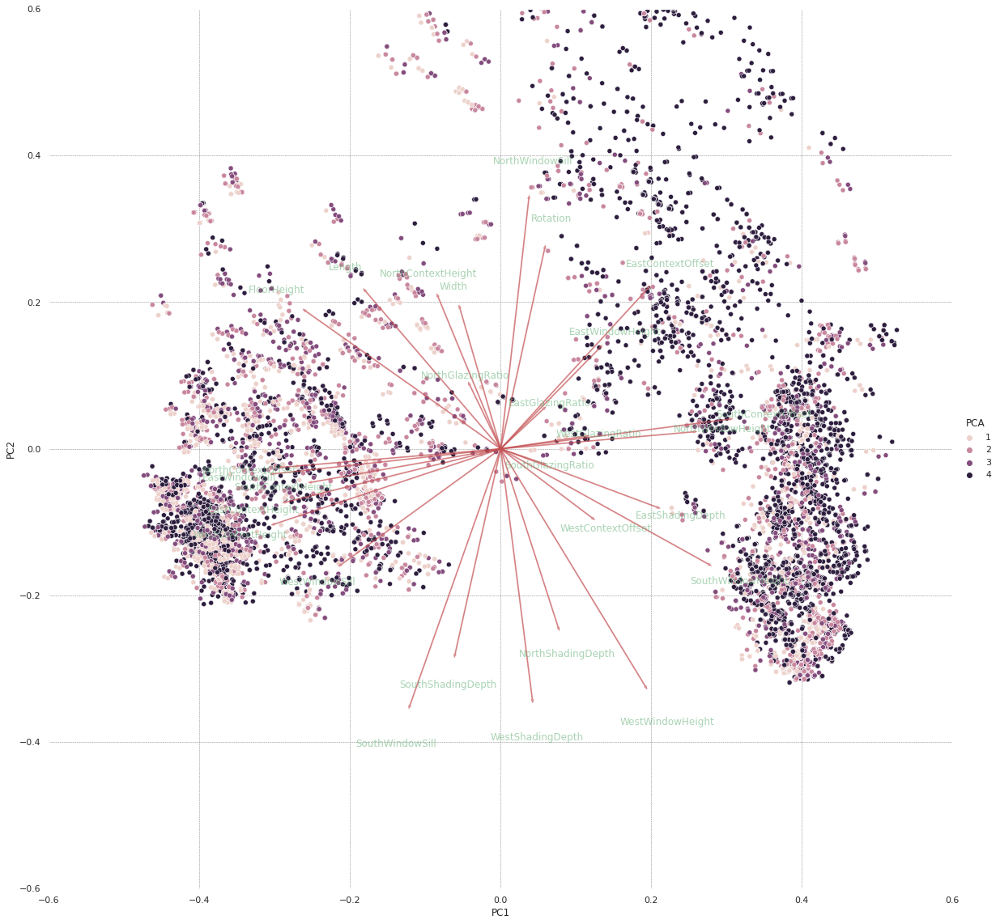

In [107]:
#PCA for sDA
def myplot_df(df,coeff, scale, labels = None):
    df["xs"] = df[df.columns[0]]
    df["ys"] = df[df.columns[1]]
    #print(df)
    
    n = coeff.shape[0]
    
    
    if scale == True:
        scalex = 1.0/(df["xs"].max() - df["xs"].min())
        scaley = 1.0/(df["ys"].max() - df["ys"].min())

        df["xs"] = scalex *  df["xs"] 
        df["ys"] = scaley * df["ys"] 
    
    g = sns.scatterplot(x='xs',y='ys', data=df, hue=color_sDA, cmap=plt.cm.RdBu)
    g.legend(title = "PCA", loc='center left', bbox_to_anchor=(1, 0.5), ncol=1, frameon = False)

    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, data_num.columns[i], color = 'g', ha = 'center', va = 'center', alpha = 0.5)
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'black', ha = 'center', va = 'center')

plt.xlim(-0.6,0.6)
plt.ylim(-0.6,0.6)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
fig = plt.gcf()
fig.set_size_inches(20, 20)
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5)
myplot_df(data_num_reduced_df_sDA,np.transpose(modelsDA.components_[0:2, :]), scale=True)
plt.show()

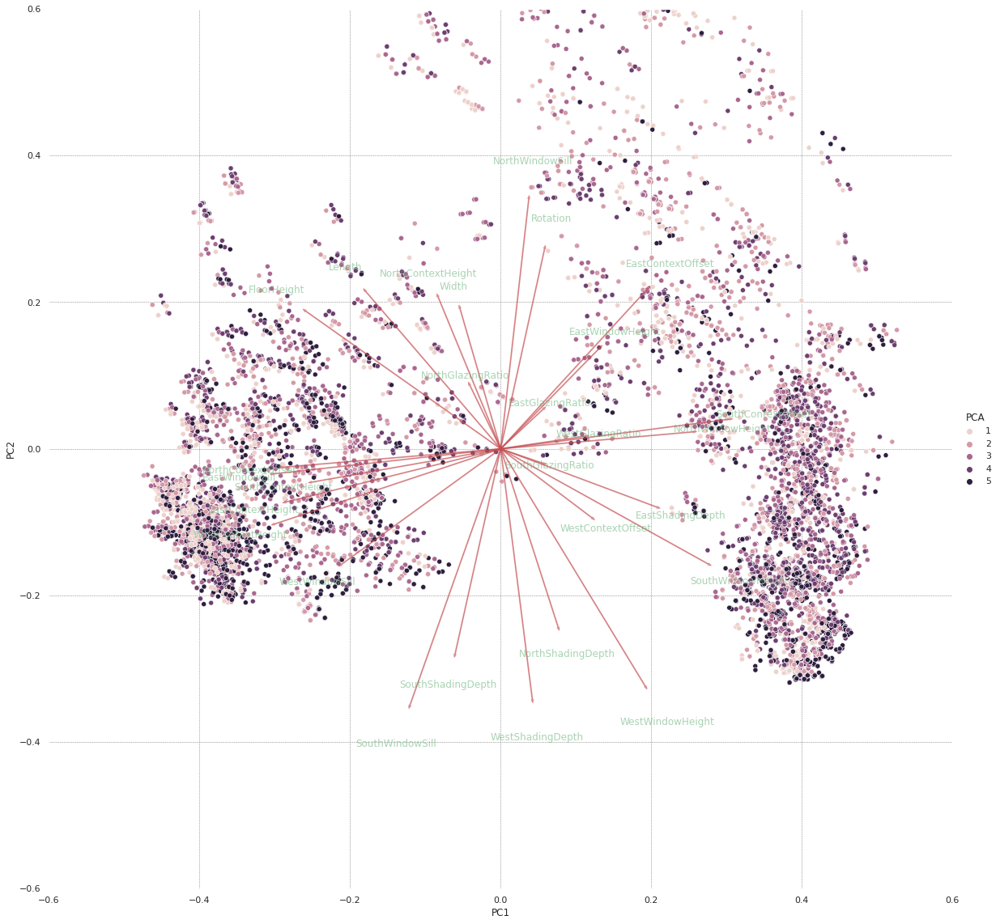

In [108]:
#PCA for UDI
def myplot_df(df,coeff, scale, labels = None):
    df["xs"] = df[df.columns[0]]
    df["ys"] = df[df.columns[1]]
    #print(df)
    
    n = coeff.shape[0]
    
    
    if scale == True:
        scalex = 1.0/(df["xs"].max() - df["xs"].min())
        scaley = 1.0/(df["ys"].max() - df["ys"].min())

        df["xs"] = scalex *  df["xs"] 
        df["ys"] = scaley * df["ys"] 
    
    g = sns.scatterplot(x='xs',y='ys', data=df, hue=color_UDI, cmap=plt.cm.RdBu)
    g.legend(title = "PCA", loc='center left', bbox_to_anchor=(1, 0.5), ncol=1, frameon = False)

    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, data_num.columns[i], color = 'g', ha = 'center', va = 'center', alpha = 0.5)
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'black', ha = 'center', va = 'center')

plt.xlim(-0.6,0.6)
plt.ylim(-0.6,0.6)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
fig = plt.gcf()
fig.set_size_inches(20, 20)
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5)
myplot_df(data_num_reduced_df_UDI,np.transpose(modelUDI.components_[0:2, :]), scale=True)
plt.show()

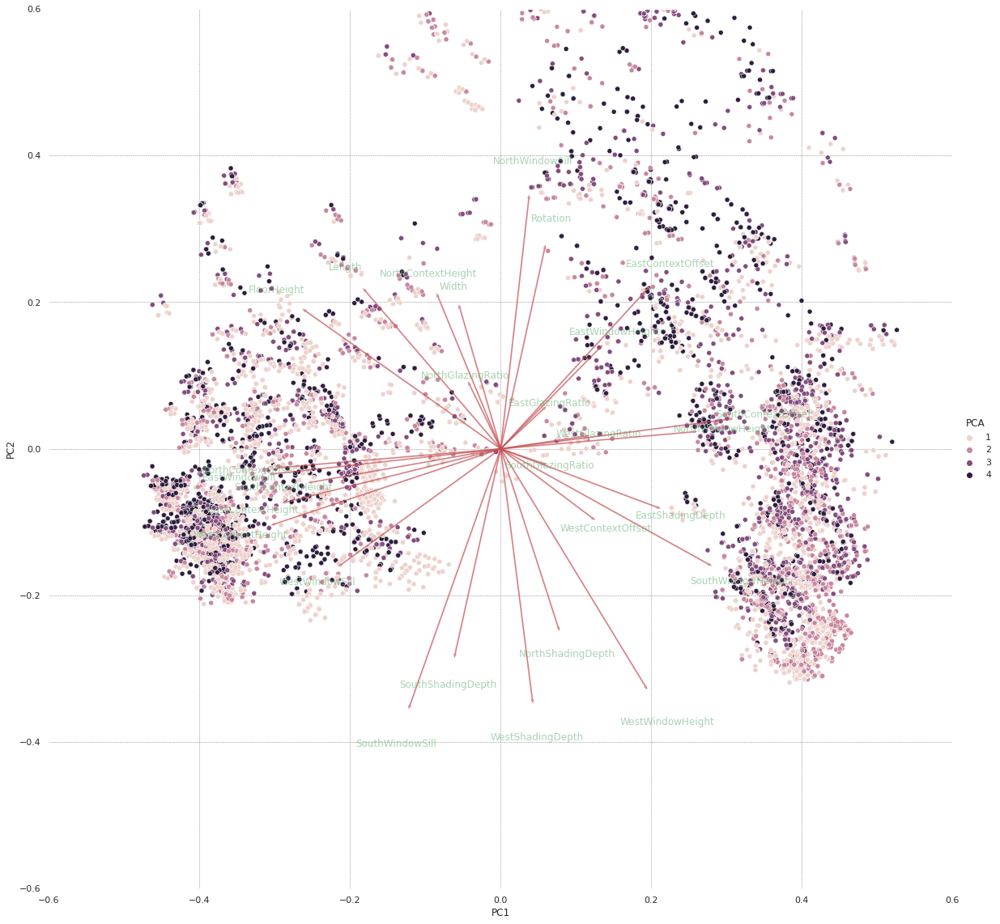

In [109]:
#PCA for ASE
def myplot_df(df,coeff, scale, labels = None):
    df["xs"] = df[df.columns[0]]
    df["ys"] = df[df.columns[1]]
    #print(df)
    
    n = coeff.shape[0]
    
    
    if scale == True:
        scalex = 1.0/(df["xs"].max() - df["xs"].min())
        scaley = 1.0/(df["ys"].max() - df["ys"].min())

        df["xs"] = scalex *  df["xs"] 
        df["ys"] = scaley * df["ys"] 
    
    g = sns.scatterplot(x='xs',y='ys', data=df, hue=color_ASE, cmap=plt.cm.RdBu)
    g.legend(title = "PCA", loc='center left', bbox_to_anchor=(1, 0.5), ncol=1, frameon = False)

    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, data_num.columns[i], color = 'g', ha = 'center', va = 'center', alpha = 0.5)
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'black', ha = 'center', va = 'center')

plt.xlim(-0.6,0.6)
plt.ylim(-0.6,0.6)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
fig = plt.gcf()
fig.set_size_inches(20, 20)
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5)
myplot_df(data_num_reduced_df_ASE,np.transpose(modelASE.components_[0:2, :]), scale=True)
plt.show()

In [40]:
#sDA
pcscores_sDA = pd.DataFrame(data_reduced_sDA)
loadings_sDA = pd.DataFrame(modelsDA.components_, columns=data_num.columns)
loadings_sDA.index = ['PC'+str(i+1) for i in range(len(pcscores_sDA.columns))]

#UDI
pcscores_UDI = pd.DataFrame(data_reduced_UDI)
loadings_UDI = pd.DataFrame(modelsDA.components_, columns=data_num.columns)
loadings_UDI.index = ['PC'+str(i+1) for i in range(len(pcscores_UDI.columns))]

#ASE
pcscores_ASE = pd.DataFrame(data_reduced_ASE)
loadings_ASE = pd.DataFrame(modelsDA.components_, columns=data_num.columns)
loadings_ASE.index = ['PC'+str(i+1) for i in range(len(pcscores_ASE.columns))]

In [41]:
sns.set(rc={'figure.figsize':(30,30)})

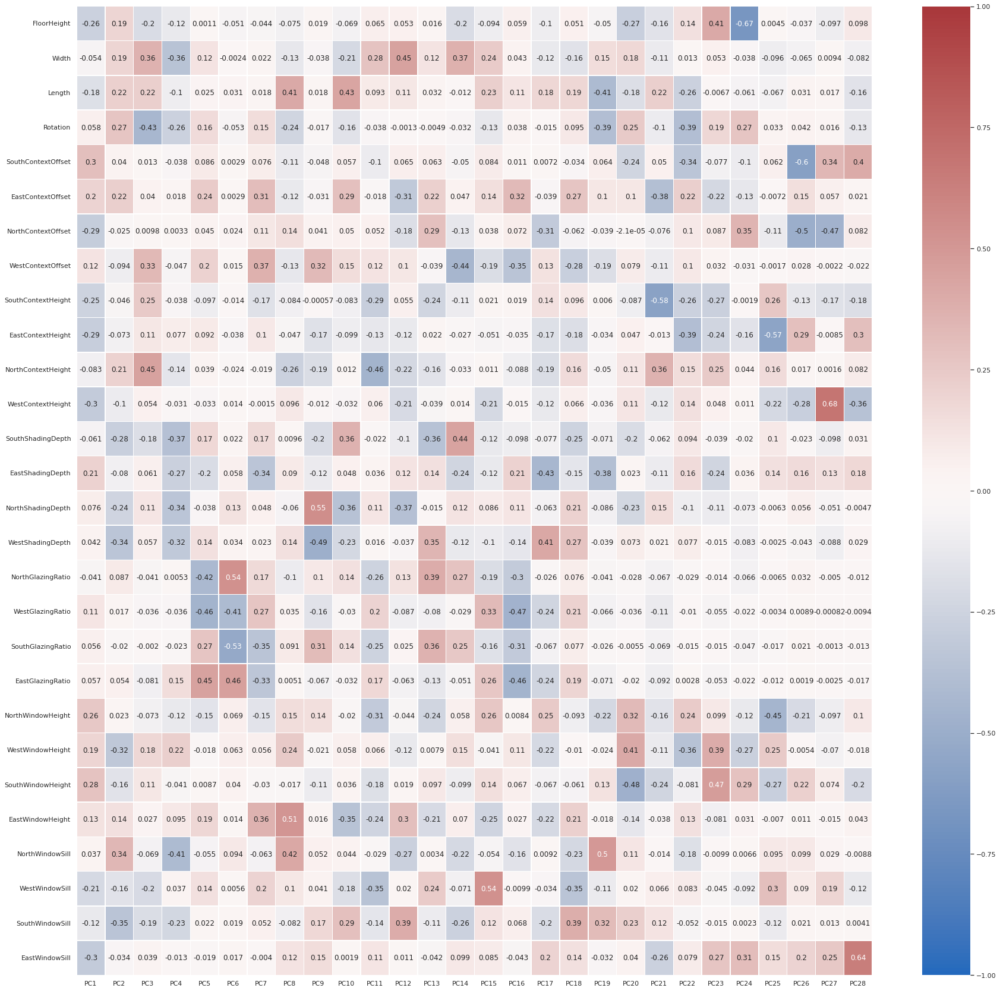

In [42]:
#sDA heat map
ax = sns.heatmap(loadings_sDA.transpose(), center=0, linewidths=0.5, 
                 cmap="vlag", vmin=-1, vmax=1, annot=True)

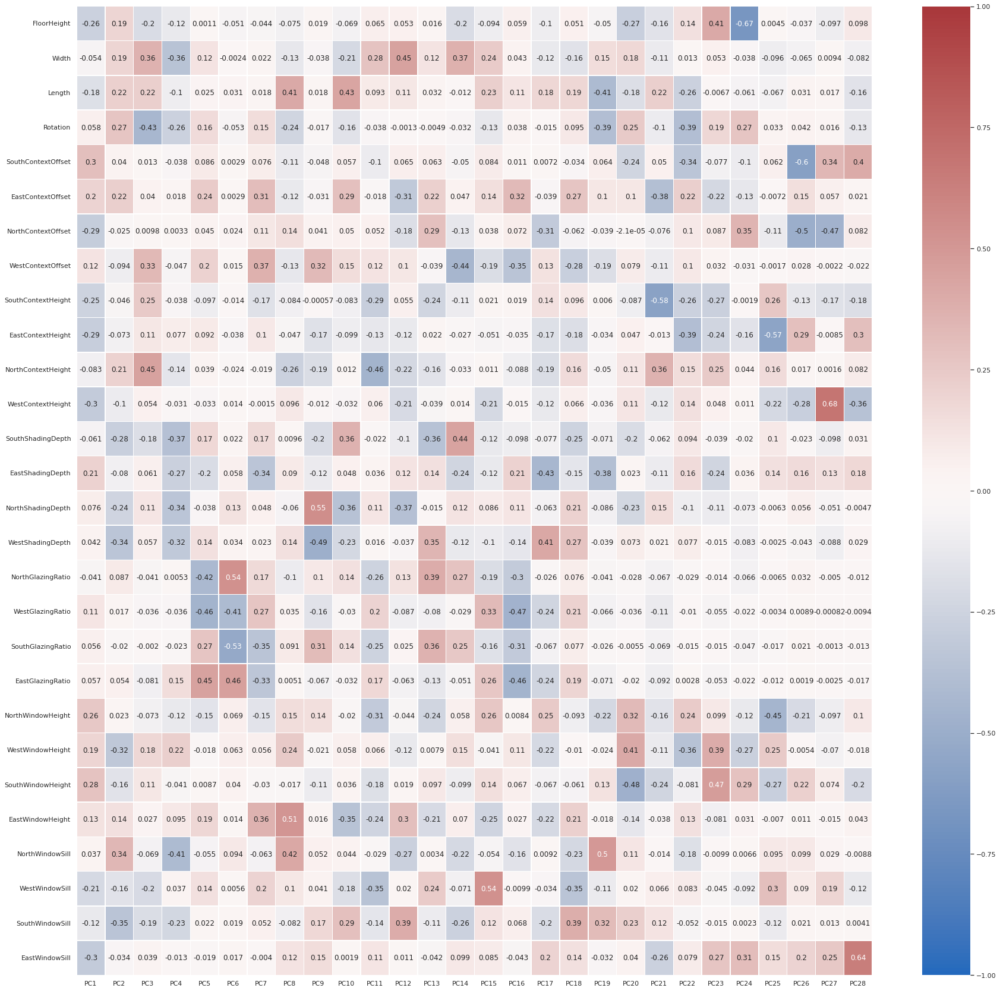

In [43]:
#UDI heat map
ax = sns.heatmap(loadings_UDI.transpose(), center=0, linewidths=0.5, 
                 cmap="vlag", vmin=-1, vmax=1, annot=True)

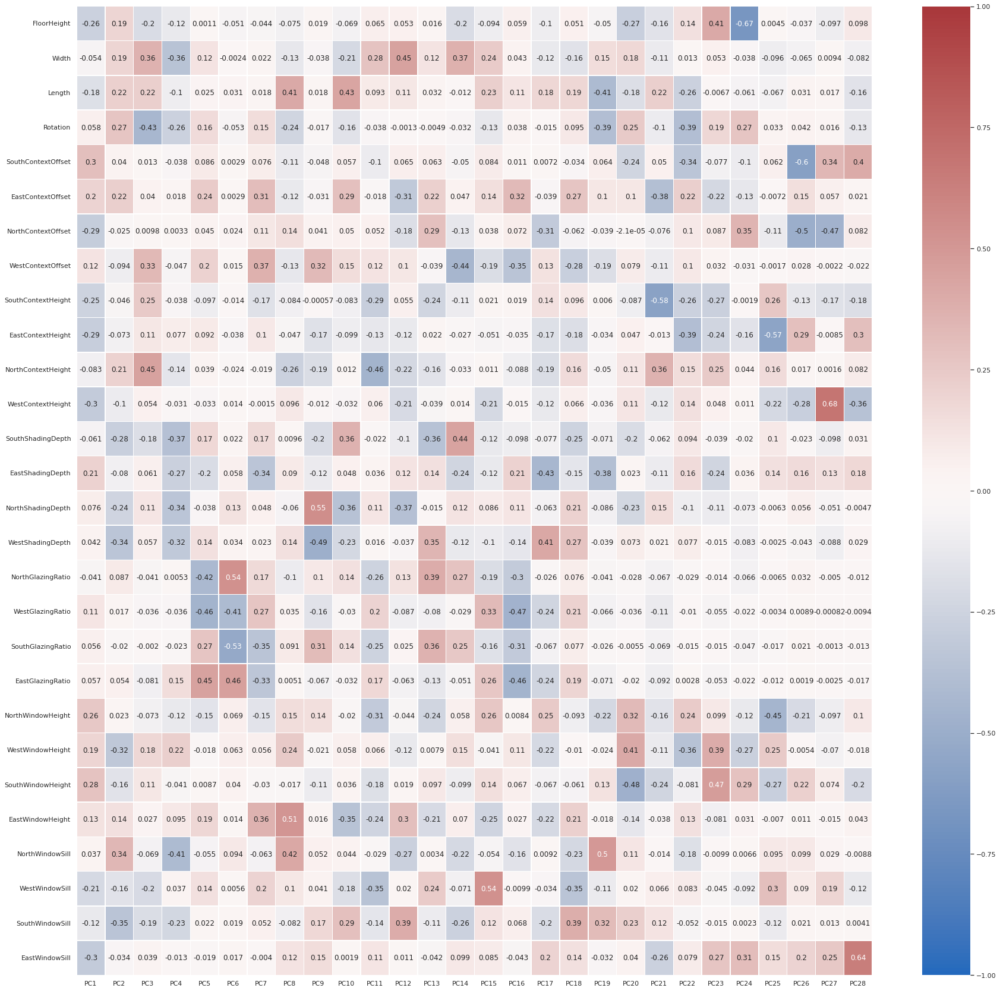

In [44]:
#ASE heat map
ax = sns.heatmap(loadings_ASE.transpose(), center=0, linewidths=0.5, 
                 cmap="vlag", vmin=-1, vmax=1, annot=True)

In [45]:
# number of components for sDA
n_pcs= modelsDA.components_.shape[0]

# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
most_important = [np.abs(modelsDA.components_[i]).argmax() for i in range(n_pcs)]

initial_feature_names = data_num.columns
# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
df = pd.DataFrame(dic.items())

print(df)

       0                   1
0    PC0  SouthContextOffset
1    PC1     SouthWindowSill
2    PC2  NorthContextHeight
3    PC3     NorthWindowSill
4    PC4    WestGlazingRatio
5    PC5   NorthGlazingRatio
6    PC6   WestContextOffset
7    PC7    EastWindowHeight
8    PC8   NorthShadingDepth
9    PC9              Length
10  PC10  NorthContextHeight
11  PC11               Width
12  PC12   NorthGlazingRatio
13  PC13   SouthShadingDepth
14  PC14      WestWindowSill
15  PC15    WestGlazingRatio
16  PC16    EastShadingDepth
17  PC17     SouthWindowSill
18  PC18     NorthWindowSill
19  PC19   SouthWindowHeight
20  PC20  SouthContextHeight
21  PC21            Rotation
22  PC22   SouthWindowHeight
23  PC23         FloorHeight
24  PC24   EastContextHeight
25  PC25  SouthContextOffset
26  PC26   WestContextHeight
27  PC27      EastWindowSill


In [46]:
# number of components for UDI
n_pcs= modelUDI.components_.shape[0]

# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
most_important = [np.abs(modelUDI.components_[i]).argmax() for i in range(n_pcs)]

initial_feature_names = data_num.columns
# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
df = pd.DataFrame(dic.items())

print(df)

       0                   1
0    PC0  SouthContextOffset
1    PC1     SouthWindowSill
2    PC2  NorthContextHeight
3    PC3     NorthWindowSill
4    PC4    WestGlazingRatio
5    PC5   NorthGlazingRatio
6    PC6   WestContextOffset
7    PC7    EastWindowHeight
8    PC8   NorthShadingDepth
9    PC9              Length
10  PC10  NorthContextHeight
11  PC11               Width
12  PC12   NorthGlazingRatio
13  PC13   SouthShadingDepth
14  PC14      WestWindowSill
15  PC15    WestGlazingRatio
16  PC16    EastShadingDepth
17  PC17     SouthWindowSill
18  PC18     NorthWindowSill
19  PC19   SouthWindowHeight
20  PC20  SouthContextHeight
21  PC21            Rotation
22  PC22   SouthWindowHeight
23  PC23         FloorHeight
24  PC24   EastContextHeight
25  PC25  SouthContextOffset
26  PC26   WestContextHeight
27  PC27      EastWindowSill


In [47]:
# number of components for ASE
n_pcs= modelASE.components_.shape[0]

# get the index of the most important feature on EACH component
# LIST COMPREHENSION HERE
most_important = [np.abs(modelASE.components_[i]).argmax() for i in range(n_pcs)]

initial_feature_names = data_num.columns
# get the names
most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

# LIST COMPREHENSION HERE AGAIN
dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

# build the dataframe
df = pd.DataFrame(dic.items())

print(df)

       0                   1
0    PC0  SouthContextOffset
1    PC1     SouthWindowSill
2    PC2  NorthContextHeight
3    PC3     NorthWindowSill
4    PC4    WestGlazingRatio
5    PC5   NorthGlazingRatio
6    PC6   WestContextOffset
7    PC7    EastWindowHeight
8    PC8   NorthShadingDepth
9    PC9              Length
10  PC10  NorthContextHeight
11  PC11               Width
12  PC12   NorthGlazingRatio
13  PC13   SouthShadingDepth
14  PC14      WestWindowSill
15  PC15    WestGlazingRatio
16  PC16    EastShadingDepth
17  PC17     SouthWindowSill
18  PC18     NorthWindowSill
19  PC19   SouthWindowHeight
20  PC20  SouthContextHeight
21  PC21            Rotation
22  PC22   SouthWindowHeight
23  PC23         FloorHeight
24  PC24   EastContextHeight
25  PC25  SouthContextOffset
26  PC26   WestContextHeight
27  PC27      EastWindowSill


## Linear Regression Attempt
based on tutorial 01 (nomad score predictions)


In [48]:
# Load and instantiate a StandardSclaer 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [49]:
# Select the (independant) features that we are going to use to train the model
X = dataMod.loc[:,["FloorHeight", "Width", "Length", "Rotation", 'SouthContextOffset', 'EastContextOffset', 'NorthContextOffset', 'WestContextOffset', 'SouthContextHeight', 'EastContextHeight', 'NorthContextHeight' , 
                   'WestContextHeight' , 'SouthShadingDepth' , 'EastShadingDepth' , 'NorthShadingDepth' , 'WestShadingDepth' , 'NorthGlazingRatio' , 'WestGlazingRatio' , 'SouthGlazingRatio' , 'EastGlazingRatio' , 
                   'NorthWindowHeight' , 'WestWindowHeight' , 'SouthWindowHeight' , 'EastWindowHeight' , 'NorthWindowSill' , 'WestWindowSill' , 'SouthWindowSill' , 'EastWindowSill' ]]

In [50]:
# Apply the scaler to our X-features
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled)
X_scaled_df

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,-1.089,-0.903,1.296,-1.384,0.258,0.469,-0.691,1.495,-1.414,-0.597,...,-0.700,-0.647,0.647,0.621,-0.916,1.945,0.512,-0.609,-1.574,-0.415
1,-1.089,-0.903,1.296,-1.384,0.258,0.469,-0.691,1.495,-1.414,-0.597,...,-0.700,-0.647,0.647,0.621,-0.916,1.945,0.512,-0.609,-1.574,-0.415
2,-1.089,-0.903,1.296,-1.384,0.258,0.469,-0.691,1.495,-1.414,-0.597,...,1.527,-0.647,0.647,0.621,-0.916,1.945,0.512,-0.609,-1.574,-0.415
3,-1.089,-0.903,1.296,-1.384,0.258,0.469,-0.691,1.495,-1.414,-0.597,...,-0.700,-0.647,0.647,0.621,-0.916,1.945,0.512,-0.609,-1.574,-0.415
4,-1.089,-0.903,1.296,-1.384,0.258,0.469,-0.691,1.495,-1.414,-0.597,...,1.527,-0.647,0.647,0.621,-0.916,1.945,0.512,-0.609,-1.574,-0.415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14179,0.721,-0.388,-0.734,-0.177,-0.329,-0.614,1.149,-0.548,0.633,1.367,...,-0.700,-0.647,-1.584,-0.682,-0.916,-0.336,-1.173,1.198,-0.032,0.926
14180,0.721,-0.388,-0.734,-0.177,-0.329,-0.614,1.149,-0.548,0.633,1.367,...,0.784,-0.647,-1.584,-0.682,-0.916,-0.336,-1.173,1.198,-0.032,0.926
14181,0.721,-0.388,-0.734,-0.177,-0.329,-0.614,1.149,-0.548,0.633,1.367,...,-0.700,1.112,-1.584,-0.682,-0.916,-0.336,-1.173,1.198,-0.032,0.926
14182,0.721,-0.388,-0.734,-0.177,-0.329,-0.614,1.149,-0.548,0.633,1.367,...,-0.700,1.112,-1.584,-0.682,-0.916,-0.336,-1.173,1.198,-0.032,0.926


In [51]:
#declare regression target for sDA
y = dataMod.sDA.to_numpy()

y = y.reshape(-1, 1)

from sklearn.preprocessing import MinMaxScaler
scalerY = MinMaxScaler()


#In this case it makes sense to use MinMax scaling because the wage seems like a relative range
# Apply the scaler to our Y-features
y_scaled = scalerY.fit_transform(y)

print(y_scaled.shape)
print(y_scaled)


(14184, 1)
[[1.    ]
 [1.    ]
 [1.    ]
 ...
 [1.    ]
 [0.9896]
 [1.    ]]


In [52]:
#declare regression target for UDI
y = dataMod.UDI.to_numpy()

y = y.reshape(-1, 1)

from sklearn.preprocessing import MinMaxScaler
scalerY = MinMaxScaler()


#In this case it makes sense to use MinMax scaling because the wage seems like a relative range
# Apply the scaler to our Y-features
y_scaled = scalerY.fit_transform(y)

print(y_scaled.shape)
print(y_scaled)

(14184, 1)
[[0.48336108]
 [0.6473359 ]
 [0.51004332]
 ...
 [0.56719344]
 [0.92987416]
 [0.89253991]]


In [53]:
#declare regression target for ASE
y = dataMod.ASE.to_numpy()

y = y.reshape(-1, 1)

from sklearn.preprocessing import MinMaxScaler
scalerY = MinMaxScaler()


#In this case it makes sense to use MinMax scaling because the wage seems like a relative range
# Apply the scaler to our Y-features
y_scaled = scalerY.fit_transform(y)

print(y_scaled.shape)
print(y_scaled)

(14184, 1)
[[0.7862]
 [0.4966]
 [0.5084]
 ...
 [0.8472]
 [0.3924]
 [0.2292]]


In [54]:
# Define the dependant variable / target to predict 
y_reg_sDA = dataMod.sDA

In [55]:
# Define the dependant variable / target to predict 
y_reg_UDI = dataMod.UDI

In [56]:
# Define the dependant variable / target to predict 
y_reg_ASE = dataMod.ASE

In [57]:
#Split the data using the train_test_split module. We keep 20% of the data for testing and use 80% to train the model
# Random state defined with an arbitrary number for reproducibility

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test, data_train, data_test = train_test_split(X_scaled, y_scaled, dataMod, test_size = 0.2, random_state = 42)

In [58]:
print(X_train.shape)
print(X_test.shape)
print(y_test.shape)
print(y_train.shape)

(11347, 28)
(2837, 28)
(2837, 1)
(11347, 1)


In [59]:
# Import and instantiate the baseline model
from sklearn.linear_model import LinearRegression
model = LinearRegression()

# Model training
model.fit(X_train, y_train)

# Model performance on the test-set / This score is R^2
print(model.score(X_test, y_test))

0.7230147179050782


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


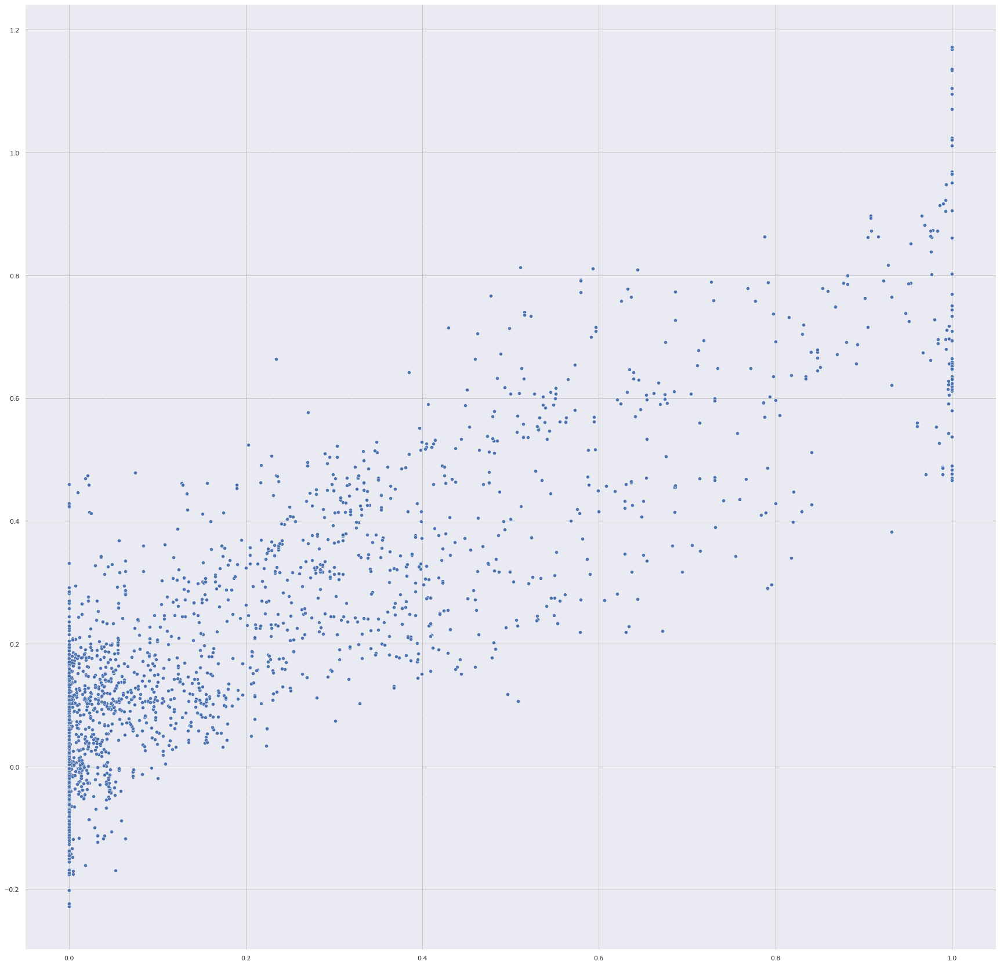

In [60]:
# We can also inspect our results visually
y_pred = model.predict(X_test)
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5)

#reshape y_test and y_pred into (x,) shape array
y_test_new = y_test.reshape(-1)
y_pred_new = y_pred.reshape(-1)

#plot
sns.scatterplot(y_test_new,y_pred_new)

In [61]:
data_test = data_test.drop(columns = ['sDABin', 'UDIBin', 'ASEBin'])

In [62]:
data_test['sDA_pred'] = y_pred_new

alt.Chart(data_test).mark_circle(size=60).encode(
    x='sDA',
    y='sDA_pred',
    color=alt.Color('sDA_Category', scale=alt.Scale(scheme='category10')),
).interactive()

Output hidden; open in https://colab.research.google.com to view.

In [63]:
data_test['UDI_pred'] = y_pred_new

alt.Chart(data_test).mark_circle(size=60).encode(
    x='UDI',
    y='UDI_pred',
    color=alt.Color('UDI_Category', scale=alt.Scale(scheme='category10')),
).interactive()

Output hidden; open in https://colab.research.google.com to view.

In [64]:
data_test['ASE_pred'] = y_pred_new

alt.Chart(data_test).mark_circle(size=60).encode(
    x='ASE',
    y='ASE_pred',
    color=alt.Color('ASE_Category', scale=alt.Scale(scheme='category10')),
).interactive()

Output hidden; open in https://colab.research.google.com to view.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


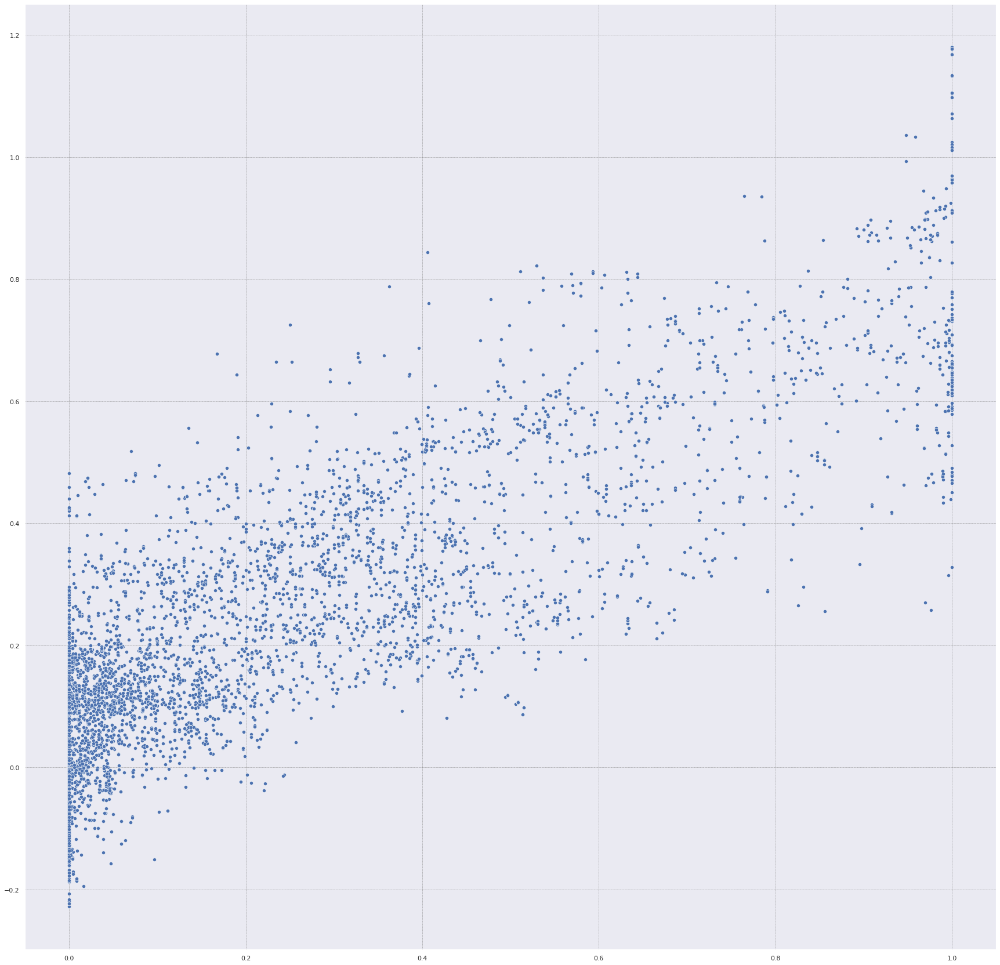

In [65]:
# We can also inspect our results visually
y_pred_train = model.predict(X_train)
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5)

#reshape y_train and y_pred_train into (x,) shape array
y_train_new = y_train.reshape(-1)
y_pred_train_new = y_pred_train.reshape(-1)

#plot
sns.scatterplot(y_train_new,y_pred_train_new)

Let's try a different model class

In [66]:
# Import and instantiate a XGBoost Regressor
import xgboost as xgb
model = xgb.XGBRegressor()

# Model training
model.fit(X_train, y_train_new)

# Model performance on the test-set / This score is not accacy but a R^2
print(model.score(X_test, y_test))

[21:37:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.9223572902039169


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


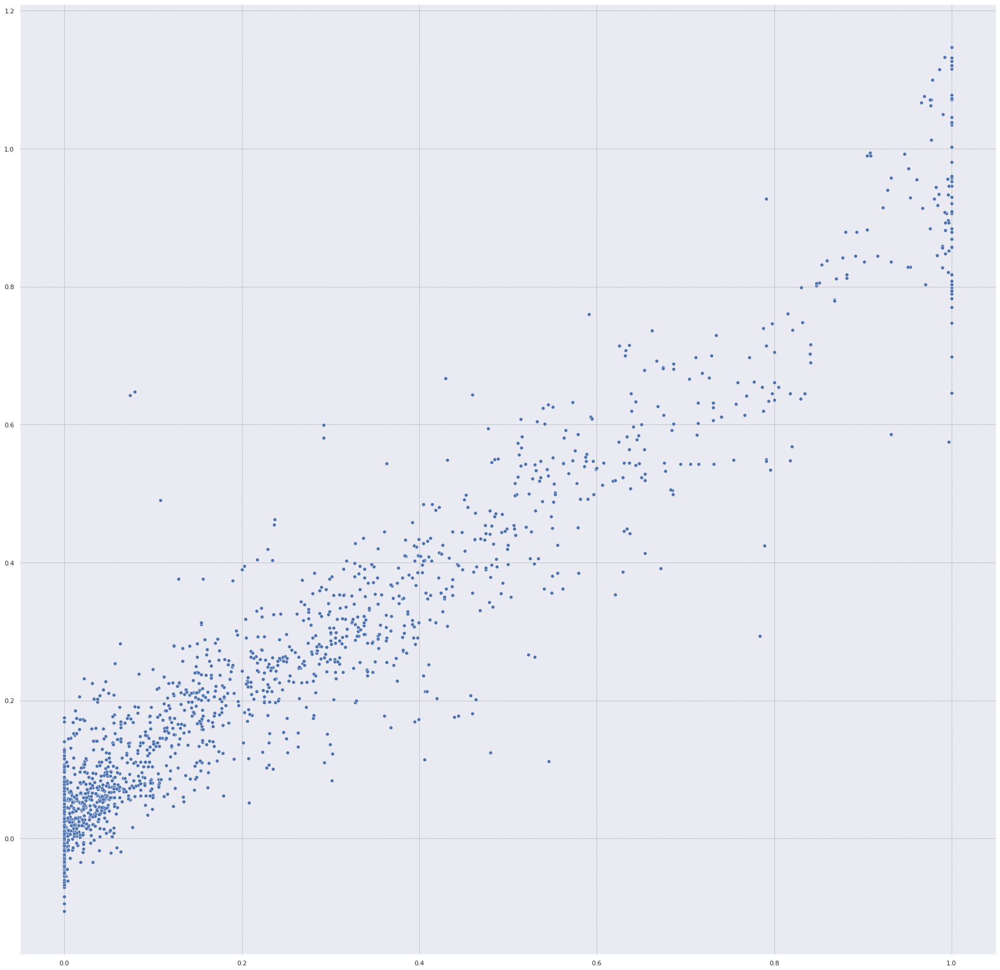

In [67]:
# We can also inspect our results visually
y_pred_new = model.predict(X_test)
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5)
sns.scatterplot(y_test_new,y_pred_new)

In [68]:
data_test['sDA_pred_xgboost'] = y_pred_new

alt.Chart(data_test).mark_circle(size=60).encode(
    x='sDA',
    y='sDA_pred_xgboost',
    color=alt.Color('sDA_Category', scale=alt.Scale(scheme='category10')),
).interactive()

Output hidden; open in https://colab.research.google.com to view.

In [69]:
data_test['UDI_pred_xgboost'] = y_pred_new

alt.Chart(data_test).mark_circle(size=60).encode(
    x='UDI',
    y='UDI_pred_xgboost',
    color=alt.Color('UDI_Category', scale=alt.Scale(scheme='category10')),
).interactive()

Output hidden; open in https://colab.research.google.com to view.

In [70]:
data_test['ASE_pred_xgboost'] = y_pred_new

alt.Chart(data_test).mark_circle(size=60).encode(
    x='ASE',
    y='ASE_pred_xgboost',
    color=alt.Color('ASE_Category', scale=alt.Scale(scheme='category10')),
).interactive()

Output hidden; open in https://colab.research.google.com to view.

## Kernal Ridge

In [71]:
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Ridge

In [72]:
krr = Ridge(alpha=1)
krr.fit(X_train, y_train)

# Model performance on the test-set / This score is R^2
print(krr.score(X_test, y_test))

0.7230124977672422


In [73]:
y_pred = krr.predict(X_test)

data_test['sDA_pred_krr'] = y_pred

alt.Chart(data_test).mark_circle(size=60).encode(
    x='sDA',
    y='sDA_pred_krr',
    color=alt.Color('sDA_Category', scale=alt.Scale(scheme='category10')),
).interactive()

Output hidden; open in https://colab.research.google.com to view.

In [74]:
y_pred = krr.predict(X_test)

data_test['UDI_pred_krr'] = y_pred

alt.Chart(data_test).mark_circle(size=60).encode(
    x='UDI',
    y='UDI_pred_krr',
    color=alt.Color('UDI_Category', scale=alt.Scale(scheme='category10')),
).interactive()

Output hidden; open in https://colab.research.google.com to view.

In [75]:
y_pred = krr.predict(X_test)

data_test['ASE_pred_krr'] = y_pred

alt.Chart(data_test).mark_circle(size=60).encode(
    x='ASE',
    y='ASE_pred_krr',
    color=alt.Color('ASE_Category', scale=alt.Scale(scheme='category10')),
).interactive()

Output hidden; open in https://colab.research.google.com to view.

#ANN Regression Attempt
based on tutorial 5

In [76]:
# Import standard Libraries
import pandas as pd
import seaborn as sns
import altair as alt
import tensorflow as tf
import matplotlib.pyplot as plt



sns.set(rc={'figure.figsize':(10,10)})
print("imports ok")

imports ok


##Prepare Data

**NORMALIZE INPUTS**

In [77]:
#same code as last time

#declare features
X = dataMod.iloc[:,0:-6]

# Load and instantiate a StandardSclaer 
from sklearn.preprocessing import StandardScaler
scalerX = StandardScaler()

# Apply the scaler to our X-features
X_scaled = scalerX.fit_transform(X)

print(X_scaled.shape)

(14184, 31)


In [78]:
X

,FloorHeight,Width,Length,Rotation,SouthContextOffset,EastContextOffset,NorthContextOffset,WestContextOffset,SouthContextHeight,EastContextHeight,...,WestWindowHeight,SouthWindowHeight,EastWindowHeight,NorthWindowSill,WestWindowSill,SouthWindowSill,EastWindowSill,sDA,UDI,ASE
0,4.000,5.667,27.333,-41.000,39.000,41.000,23.000,73.000,2.000,116.000,...,7.000,2.000,10.000,3.000,2.000,2.000,2.000,100.000,46.753,78.620
1,4.000,5.667,27.333,-41.000,39.000,41.000,23.000,73.000,2.000,116.000,...,7.000,2.000,10.000,3.000,2.000,2.000,2.000,100.000,62.613,49.660
2,4.000,5.667,27.333,-41.000,39.000,41.000,23.000,73.000,2.000,116.000,...,7.000,2.000,10.000,3.000,2.000,2.000,2.000,100.000,49.333,50.840
3,4.000,5.667,27.333,-41.000,39.000,41.000,23.000,73.000,2.000,116.000,...,7.000,2.000,10.000,3.000,2.000,2.000,2.000,24.580,29.116,13.300
4,4.000,5.667,27.333,-41.000,39.000,41.000,23.000,73.000,2.000,116.000,...,7.000,2.000,10.000,3.000,2.000,2.000,2.000,29.460,40.278,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14179,8.000,8.000,9.000,-16.000,25.000,25.000,74.000,20.000,207.000,419.000,...,4.000,2.000,3.000,1.000,5.000,4.000,4.000,74.310,73.483,39.240
14180,8.000,8.000,9.000,-16.000,25.000,25.000,74.000,20.000,207.000,419.000,...,4.000,2.000,3.000,1.000,5.000,4.000,4.000,84.720,96.219,0.000
14181,8.000,8.000,9.000,-16.000,25.000,25.000,74.000,20.000,207.000,419.000,...,4.000,2.000,3.000,1.000,5.000,4.000,4.000,100.000,54.861,84.720
14182,8.000,8.000,9.000,-16.000,25.000,25.000,74.000,20.000,207.000,419.000,...,4.000,2.000,3.000,1.000,5.000,4.000,4.000,98.960,89.941,39.240


In [79]:
#declare regression target sDA
y_sDA = dataMod.loc[:,"sDA"].to_numpy()


y_sDA = y_sDA.reshape(-1, 1)

from sklearn.preprocessing import MinMaxScaler
scalerY = MinMaxScaler()


#In this case it makes sense to use MinMax scaling because the wage seems like a relative range
# Apply the scaler to our Y-features
y_sDA_scaled = scalerY.fit_transform(y_sDA)

print(y_sDA_scaled.shape)
print(y_sDA_scaled)


(14184, 1)
[[1.    ]
 [1.    ]
 [1.    ]
 ...
 [1.    ]
 [0.9896]
 [1.    ]]


In [80]:
y_sDA

array([[100.  ],
       [100.  ],
       [100.  ],
       ...,
       [100.  ],
       [ 98.96],
       [100.  ]])

In [81]:
#declare regression target UDI
y_UDI = dataMod.loc[:,"UDI"].to_numpy()


y_UDI = y_UDI.reshape(-1, 1)

from sklearn.preprocessing import MinMaxScaler
scalerY = MinMaxScaler()


#In this case it makes sense to use MinMax scaling because the wage seems like a relative range
# Apply the scaler to our Y-features
y_UDI_scaled = scalerY.fit_transform(y_UDI)

print(y_UDI_scaled.shape)
print(y_UDI_scaled)


(14184, 1)
[[0.48336108]
 [0.6473359 ]
 [0.51004332]
 ...
 [0.56719344]
 [0.92987416]
 [0.89253991]]


In [82]:
y_UDI

array([[46.752525],
       [62.612795],
       [49.333333],
       ...,
       [54.861111],
       [89.940972],
       [86.329861]])

In [83]:
#declare regression target UDI
y_ASE = dataMod.loc[:,"ASE"].to_numpy()


y_ASE = y_ASE.reshape(-1, 1)

from sklearn.preprocessing import MinMaxScaler
scalerY = MinMaxScaler()


#In this case it makes sense to use MinMax scaling because the wage seems like a relative range
# Apply the scaler to our Y-features
y_ASE_scaled = scalerY.fit_transform(y_ASE)

print(y_ASE_scaled.shape)
print(y_ASE_scaled)

(14184, 1)
[[0.7862]
 [0.4966]
 [0.5084]
 ...
 [0.8472]
 [0.3924]
 [0.2292]]


**SPLIT INTO TRAIN AND TEST**

###only run 1 out of 3

In [84]:
from sklearn.model_selection import train_test_split
#sDA 
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_sDA_scaled, test_size = 0.2, random_state = 21)

In [85]:
from sklearn.model_selection import train_test_split
#UDI
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_UDI_scaled, test_size = 0.2, random_state = 21)

In [86]:
from sklearn.model_selection import train_test_split
#ASE 
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_ASE_scaled, test_size = 0.2, random_state = 21)

###visualize our data


In [87]:
#we can see that scikitlearn doesnt care if it is a dataframe or a numpy array, because they all function on the same way 
print("TRAIN", "input", X_train.shape, "output", y_train.shape)
print("TEST", "input", X_test.shape, "output", y_test.shape)


TRAIN input (11347, 31) output (11347, 1)
TEST input (2837, 31) output (2837, 1)


#Build model

From the cheatSheet
Regression between 0 and 1>> 
      activation = relu for hidden layers / sigmoid for final layer
      loss = mean squared error
      optimizer = adam
      input from data, is 8 columns
      output is 1 value prediction

In [88]:
# Instantiate a sequential model
tf.random.set_seed(5)
modelANN = tf.keras.Model()
modelANN = tf.keras.models.Sequential()
n_cols = X_scaled.shape[1]  

# Add 3 dense layers of 64, 32, 16 neurons each
modelANN.add(tf.keras.layers.Dense(64, input_shape=(n_cols,), activation='relu'))
modelANN.add(tf.keras.layers.Dense(32, input_shape=(n_cols,), activation='relu'))
modelANN.add(tf.keras.layers.Dense(16, activation='relu'))
  
# Add a dense layer with 3 value output
modelANN.add(tf.keras.layers.Dense(3, activation= "sigmoid"))
  
# Compile your model 
modelANN.compile(optimizer = "adam", loss = "mean_squared_error")

100, 50, 32
16,8, 1


In [89]:
modelANN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                2048      
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 16)                528       
                                                                 
 dense_3 (Dense)             (None, 3)                 51        
                                                                 
Total params: 4,707
Trainable params: 4,707
Non-trainable params: 0
_________________________________________________________________


#Train model

In [90]:
# Fit your model to the training data for 200 epochs
#we assign this to history variable so we can plot the training data
history = modelANN.fit(X_train,y_train,epochs=200, validation_split=0.2)

Epoch 1/200
284/284 [==============================] - 2s 3ms/step - loss: 0.0199 - val_loss: 0.0021
Epoch 2/200
284/284 [==============================] - 1s 2ms/step - loss: 0.0014 - val_loss: 0.0011
Epoch 3/200
284/284 [==============================] - 1s 2ms/step - loss: 8.1310e-04 - val_loss: 7.2824e-04
Epoch 4/200
284/284 [==============================] - 1s 2ms/step - loss: 5.6052e-04 - val_loss: 5.7721e-04
Epoch 5/200
284/284 [==============================] - 1s 2ms/step - loss: 4.1132e-04 - val_loss: 4.4200e-04
Epoch 6/200
284/284 [==============================] - 1s 2ms/step - loss: 3.3256e-04 - val_loss: 3.7103e-04
Epoch 7/200
284/284 [==============================] - 1s 2ms/step - loss: 2.6543e-04 - val_loss: 2.9775e-04
Epoch 8/200
284/284 [==============================] - 1s 2ms/step - loss: 2.1914e-04 - val_loss: 2.6658e-04
Epoch 9/200
284/284 [==============================] - 1s 2ms/step - loss: 1.9416e-04 - val_loss: 2.2587e-04
Epoch 10/200
284/284 [=============

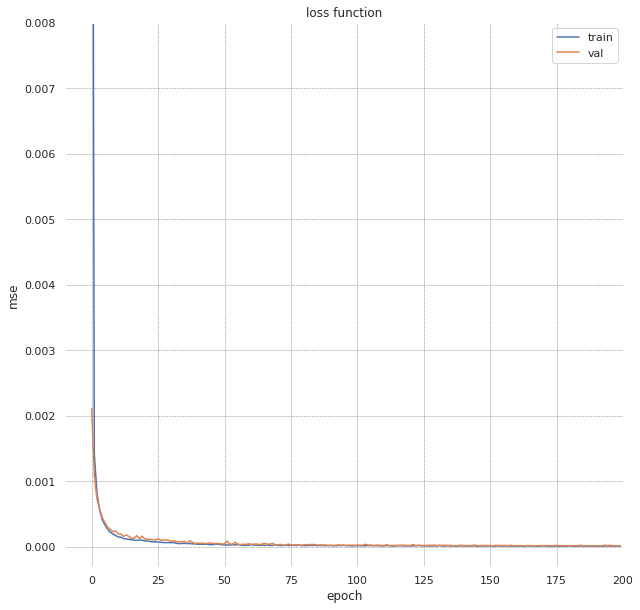

In [91]:
# summarize history for accuracy
plt.rcParams['axes.facecolor'] = 'white'
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('loss function')
plt.ylabel('mse')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.xlim(-10, 200)
plt.ylim(-0.0003, 0.008)
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5)
plt.show()

In [92]:
# import joblib

In [93]:
#export models for hops
# modelANN.save('/content/drive/MyDrive/0.Thesis/Hops/ANNModel.h5')

# scalerX_filename = "/content/drive/MyDrive/0.Thesis/Hops/scalerX"
# joblib.dump(scalerX, scalerX_filename)
# scalerY_filename = "/content/drive/MyDrive/0.Thesis/Hops/scalerY"
# joblib.dump(scalerY, scalerY_filename)


#Evaluate model on test data



In [94]:
# Evaluate your model accuracy on the test data
loss_test = modelANN.evaluate(X_test,y_test)

# Print accuracy
print('mse_test:', loss_test)

89/89 [==============================] - 0s 1ms/step - loss: 1.2494e-05
mse_test: 1.2494452676037326e-05


we can see the model is again slightly overfitting, but what does this translate in terms of USD accuracy of our prediction?

#Plot error


In [95]:
data_test

,FloorHeight,Width,Length,Rotation,SouthContextOffset,EastContextOffset,NorthContextOffset,WestContextOffset,SouthContextHeight,EastContextHeight,...,ASE_Category,sDA_pred,UDI_pred,ASE_pred,sDA_pred_xgboost,UDI_pred_xgboost,ASE_pred_xgboost,sDA_pred_krr,UDI_pred_krr,ASE_pred_krr
5589,3.000,10.667,8.667,-14.000,62.000,44.000,21.000,75.000,74.000,83.000,...,1,0.003,0.003,0.003,0.014,0.014,0.014,0.003,0.003,0.003
5886,4.000,6.000,9.000,-22.000,54.000,45.000,13.000,17.000,55.000,83.000,...,3,0.327,0.327,0.327,0.279,0.279,0.279,0.327,0.327,0.327
12096,8.000,7.667,12.000,-16.000,24.000,26.000,76.000,26.000,217.000,386.000,...,4,0.657,0.657,0.657,0.844,0.844,0.844,0.657,0.657,0.657
168,5.000,11.000,20.000,-21.000,31.000,75.000,88.000,70.000,114.000,100.000,...,4,0.518,0.518,0.518,0.444,0.444,0.444,0.518,0.518,0.518
13910,6.000,9.667,12.333,-16.000,3.000,25.000,70.000,29.000,224.000,416.000,...,2,0.128,0.128,0.128,0.115,0.115,0.115,0.128,0.128,0.128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8282,7.000,8.333,14.333,-24.000,21.000,24.000,69.000,51.000,187.000,158.000,...,4,0.151,0.151,0.151,0.178,0.178,0.178,0.151,0.151,0.151
12422,8.000,8.000,9.000,-16.000,24.000,26.000,75.000,28.000,215.000,419.000,...,3,0.288,0.288,0.288,0.211,0.211,0.211,0.288,0.288,0.288
11335,9.000,9.333,25.667,-16.000,3.000,25.000,67.000,18.000,218.000,381.000,...,2,0.147,0.147,0.147,0.096,0.096,0.096,0.147,0.147,0.147
9856,7.000,17.000,31.667,-19.000,4.000,21.000,72.000,10.000,154.000,411.000,...,3,0.505,0.505,0.505,0.353,0.353,0.353,0.505,0.505,0.505


In [96]:
def plot_comparison(x_val, pred, truth, xlab, ylab):
  fig, ax1 = plt.subplots()
  ax1.plot(x_val, truth, color = "red", label = "truth",linestyle='None', marker = "o", markersize = 5)
  ax1.plot(x_val, pred, color = "blue", label = "pred",linestyle='None', marker = "o", markersize = 4, alpha = 0.5)

  ax1.set_xlabel(xlab)
  ax1.set_ylabel(ylab)
  ax1.legend(loc='upper right')
  plt.grid(color = 'grey', linestyle = '--', linewidth = 0.5)
  fig.set_figheight(10)
  fig.set_figwidth(10)
  plt.title('Prediction Comparison')
  plt.show()

In [97]:
y_pred

array([[0.00344936],
       [0.32720257],
       [0.65656546],
       ...,
       [0.14696659],
       [0.50465699],
       [0.26795779]])

In [98]:
sDA = list(data_test.sDA)
for i in range(len(sDA)):
  if sDA[i] < 0.01:
    print(i)

14
19
28
34
53
54
63
67
88
91
138
148
149
164
167
173
188
189
195
215
217
221
238
240
244
247
257
260
271
282
286
293
294
302
324
332
341
359
367
369
377
378
386
406
408
413
420
430
433
440
443
452
455
468
472
475
480
483
521
531
537
553
567
609
611
614
645
669
675
680
719
720
726
727
738
740
745
747
754
757
779
797
809
817
838
842
850
857
870
887
914
919
922
925
929
931
933
949
952
956
962
963
977
983
984
994
995
1007
1008
1011
1015
1038
1041
1059
1073
1075
1076
1085
1097
1118
1170
1208
1217
1240
1241
1244
1249
1250
1251
1270
1279
1282
1295
1298
1300
1303
1322
1332
1350
1364
1379
1381
1382
1389
1405
1407
1411
1427
1436
1450
1459
1460
1472
1476
1485
1488
1499
1505
1519
1525
1527
1531
1539
1541
1546
1548
1578
1586
1588
1591
1596
1601
1622
1636
1650
1658
1660
1665
1674
1679
1680
1691
1710
1715
1716
1719
1734
1735
1741
1745
1758
1772
1792
1798
1808
1810
1811
1815
1848
1869
1919
1920
1921
1927
1951
1966
1968
1969
1973
1977
1982
2002
2024
2034
2045
2049
2056
2061
2074
2078
2079
2085
2093
20

In [99]:
data_test.iloc[[338]]

,FloorHeight,Width,Length,Rotation,SouthContextOffset,EastContextOffset,NorthContextOffset,WestContextOffset,SouthContextHeight,EastContextHeight,...,ASE_Category,sDA_pred,UDI_pred,ASE_pred,sDA_pred_xgboost,UDI_pred_xgboost,ASE_pred_xgboost,sDA_pred_krr,UDI_pred_krr,ASE_pred_krr
1061,9.000,6.000,27.333,-37.000,38.000,41.000,21.000,4.000,2.000,22.000,...,4,0.969,0.969,0.969,0.770,0.770,0.770,0.969,0.969,0.969


In [100]:
X_test

array([[ 0.26815718, -0.53475123,  1.4805363 , ..., -1.52860968,
        -0.33594044, -0.77368984],
       [ 1.17290065, -0.09311754, -0.2908122 , ...,  0.43126126,
         0.91787915,  0.22140487],
       [ 0.26815718,  0.569333  ,  0.07821874, ..., -1.60895578,
        -2.52456728, -0.77800696],
       ...,
       [ 1.17290065, -0.24032877, -0.10629673, ...,  0.99968383,
        -1.12653264,  2.65158014],
       [ 0.72052891, -0.01951192,  0.74247443, ...,  0.31622025,
         1.0614945 , -0.77800696],
       [-1.08895801, -0.8291737 , -0.54913385, ...,  0.95455437,
         1.01167004, -0.3106794 ]])

In [101]:
#print(y_truth[373])
print(y_pred[243])

[0.32858456]


In [102]:
#define y_pred and y_truth
y_pred = scalerY.inverse_transform(modelANN.predict(X_test))
y_truth = scalerY.inverse_transform(y_test)


In [103]:
scalerX.inverse_transform(X_test)

array([[  7.        ,   7.33333333,  29.        , ...,   3.08      ,
         55.881773  ,   0.12      ],
       [  9.        ,   9.33333333,  13.        , ...,  78.21      ,
         87.895299  ,  27.78      ],
       [  7.        ,  12.33333333,  16.33333333, ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [  9.        ,   8.66666667,  14.66666667, ..., 100.        ,
         35.69574   ,  95.33      ],
       [  8.        ,   9.66666667,  22.33333333, ...,  73.8       ,
         91.562201  ,   0.        ],
       [  4.        ,   6.        ,  10.66666667, ...,  98.27      ,
         90.290043  ,  12.99      ]])

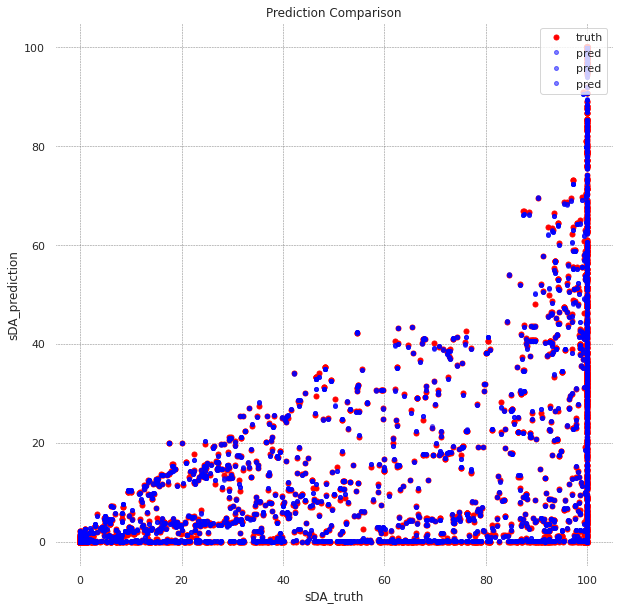

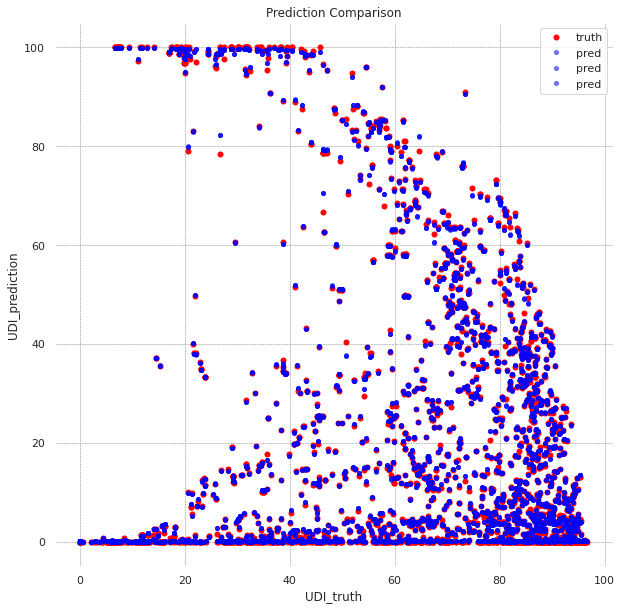

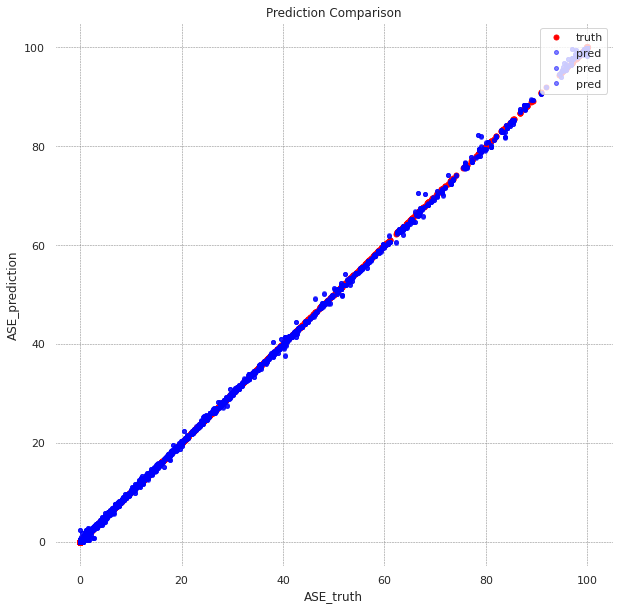

In [104]:
#change y labels, as needed, based on what output you're testing
#Plot comparisons - predication vs truth
sDA_test = (scalerX.inverse_transform(X_test)[:,28])
UDI_test = (scalerX.inverse_transform(X_test)[:,29])
ASE_test = (scalerX.inverse_transform(X_test)[:,30])

plot_comparison(sDA_test, y_pred, y_truth,  "sDA_truth", "sDA_prediction")
plot_comparison(UDI_test, y_pred, y_truth,  "UDI_truth", "UDI_prediction")
plot_comparison(ASE_test, y_pred, y_truth,  "ASE_truth", "ASE_prediction")

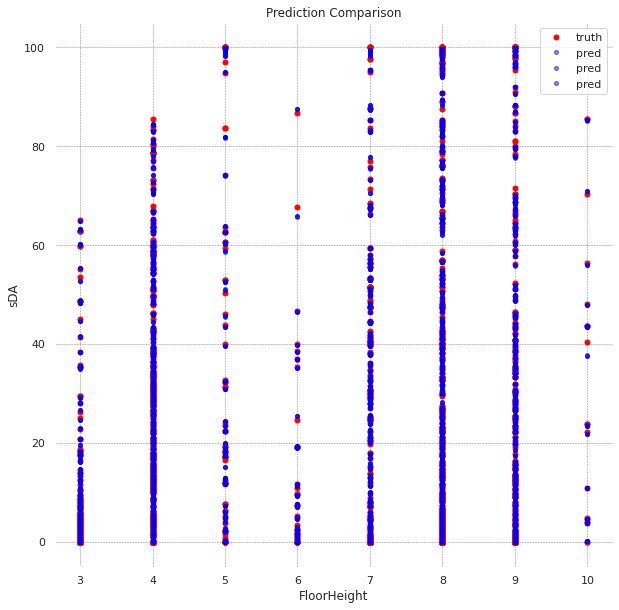

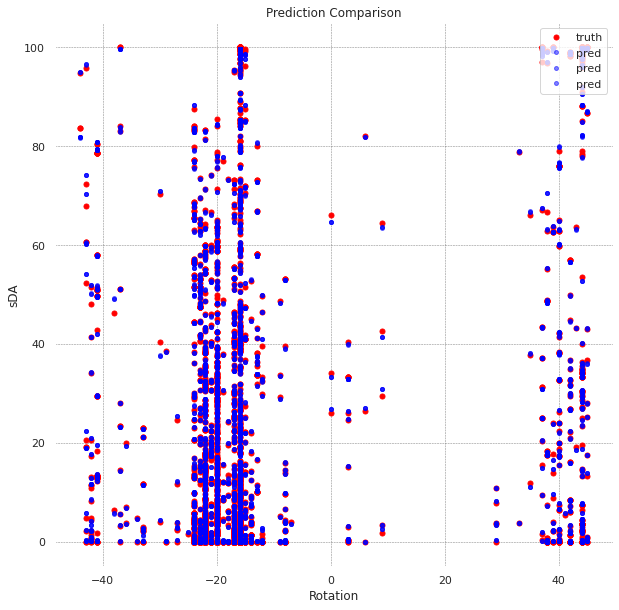

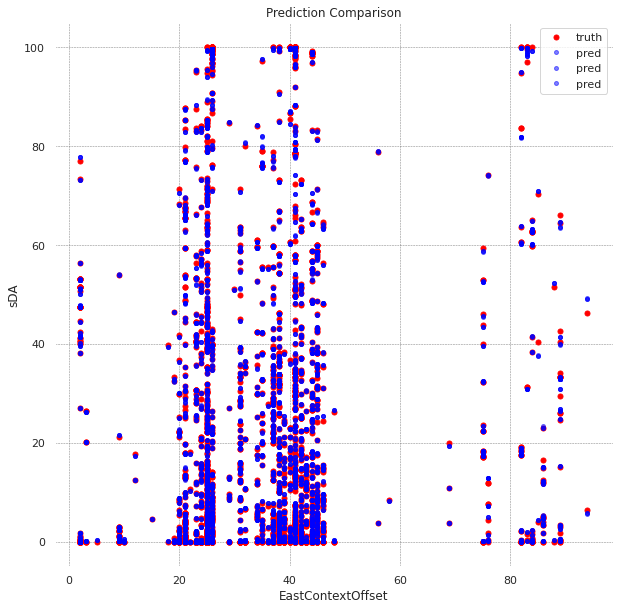

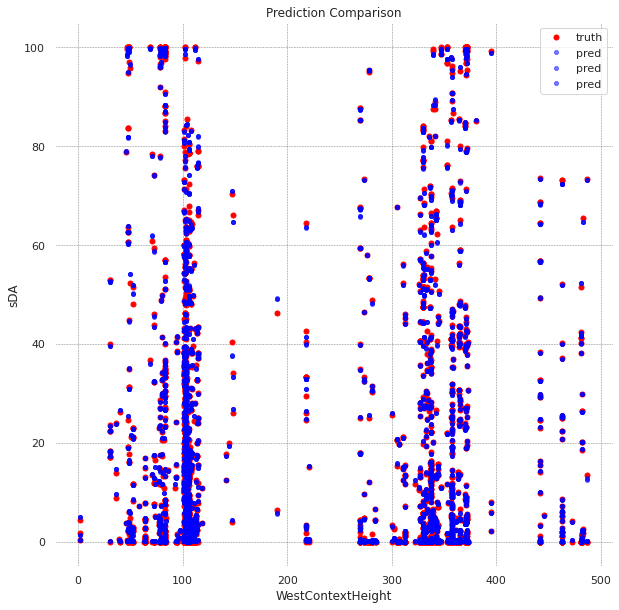

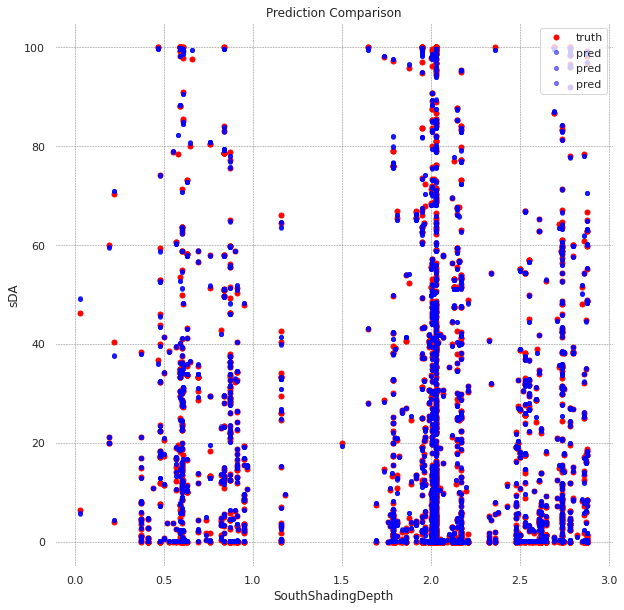

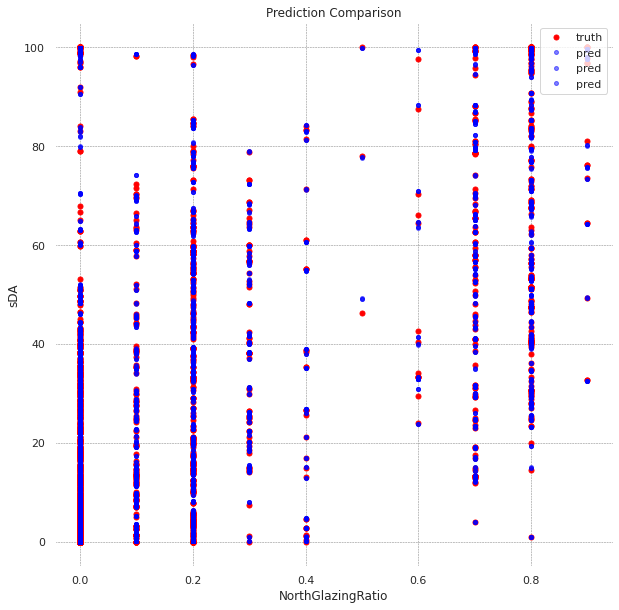

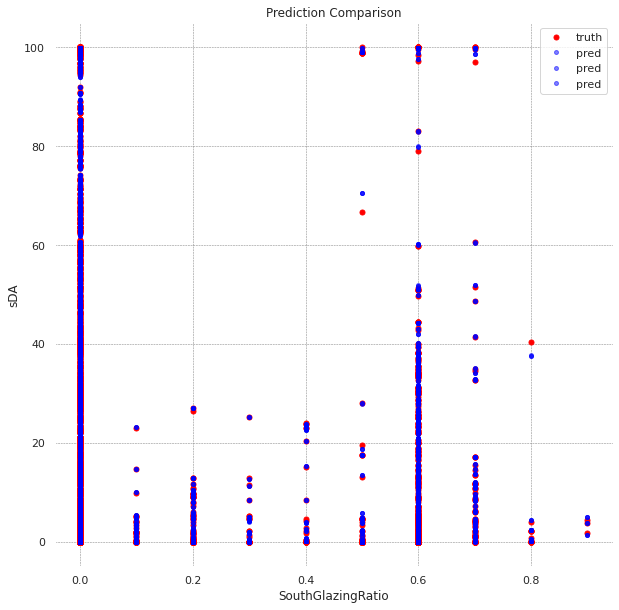

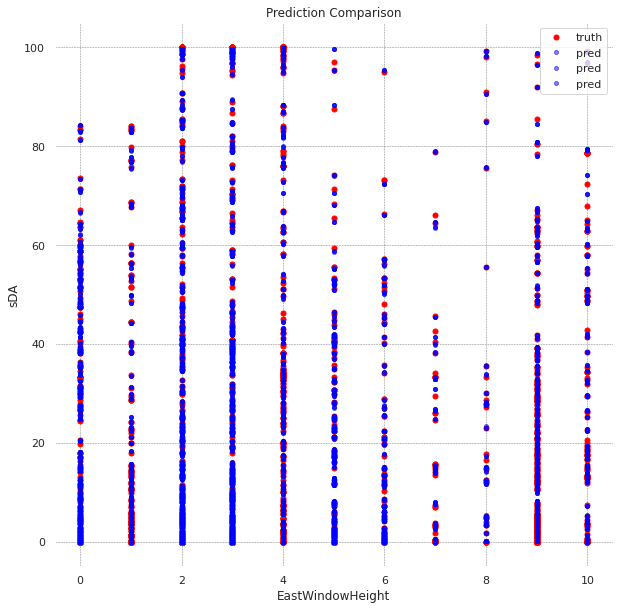

In [105]:
#Plot comparisons
FloorHeight_test = (scalerX.inverse_transform(X_test)[:,0])
Rotation_test = (scalerX.inverse_transform(X_test)[:,3])
EastContextOffset_test = (scalerX.inverse_transform(X_test)[:,5])
WestContextHeight_test = (scalerX.inverse_transform(X_test)[:,11])
SouthShadingDepth_test = (scalerX.inverse_transform(X_test)[:,12])
NorthGlazingRatio_test = (scalerX.inverse_transform(X_test)[:,16])
SouthGlazingRatio_test = (scalerX.inverse_transform(X_test)[:,18])
EastWindowHeight_test = (scalerX.inverse_transform(X_test)[:,23])

plot_comparison(FloorHeight_test, y_pred, y_truth, "FloorHeight", "sDA")
plot_comparison(Rotation_test, y_pred, y_truth, "Rotation", "sDA")
plot_comparison(EastContextOffset_test, y_pred, y_truth, "EastContextOffset", "sDA")
plot_comparison(WestContextHeight_test, y_pred, y_truth, "WestContextHeight", "sDA")
plot_comparison(SouthShadingDepth_test, y_pred, y_truth, "SouthShadingDepth", "sDA")
plot_comparison(NorthGlazingRatio_test, y_pred, y_truth,  "NorthGlazingRatio", "sDA")
plot_comparison(SouthGlazingRatio_test, y_pred, y_truth,  "SouthGlazingRatio", "sDA")
plot_comparison(EastWindowHeight_test, y_pred, y_truth,  "EastWindowHeight", "sDA")

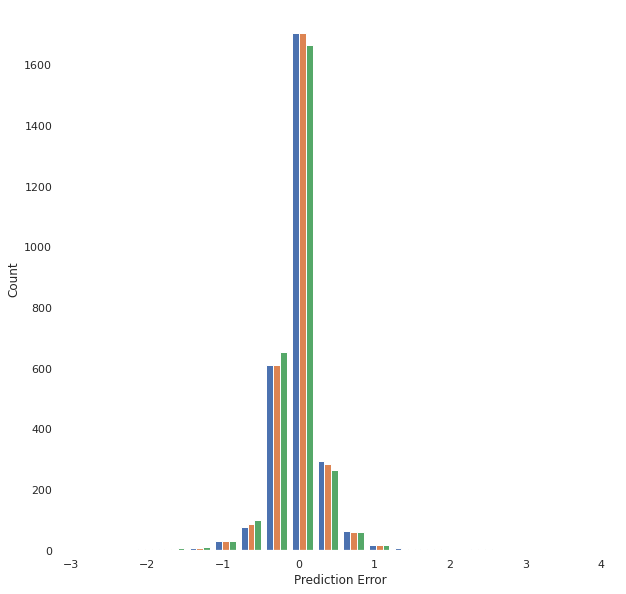

In [106]:
error = y_pred - y_truth
plt.hist(error, bins=20)
plt.xlabel('Prediction Error')
_ = plt.ylabel('Count')